# Importing Libraries

In [221]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly.offline import plot, iplot, init_notebook_mode
from ydata_profiling import ProfileReport
from scipy.stats import ttest_ind
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, f_regression, chi2
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error


import warnings
warnings.filterwarnings('ignore')

In [222]:
data = pd.read_csv("Products_Information.csv")
data.head()

,id,date,store_nbr,product_type,sales,special_offer
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [253]:
data.iloc[0:]

,id,date,store_nbr,product_type,sales,special_offer,year,month,day_of_week,is_weekend,sales_lag_1,sales_lag_7,sales_lag_15,sales_lag_30,sales_lag_60,rolling_avg_sales
index_date,,,,,,,,,,,,,,,,
2013-01-01,0,2013-01-01,1,0,0.0,0,2013,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0000
2013-01-02,1782,2013-01-02,1,0,2.0,0,2013,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0000
2013-01-03,3564,2013-01-03,1,0,3.0,0,2013,0,3,0,2.0,0.0,0.0,0.0,0.0,0.0000
2013-01-04,5346,2013-01-04,1,0,3.0,0,2013,0,4,0,3.0,0.0,0.0,0.0,0.0,0.0000
2013-01-05,7128,2013-01-05,1,0,5.0,0,2013,0,5,1,3.0,0.0,0.0,0.0,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,2993627,2017-08-11,54,32,0.0,0,2017,7,4,0,2.0,0.0,2.0,1.0,5.0,3.1250
2017-08-12,2995409,2017-08-12,54,32,1.0,1,2017,7,5,1,0.0,3.0,4.0,0.0,0.0,3.0625
2017-08-13,2997191,2017-08-13,54,32,2.0,0,2017,7,6,1,1.0,0.0,4.0,0.0,3.0,2.9375


 ### Converting 'date' to datetime object

In [224]:
data['date'] = pd.to_datetime(data['date'])  # Converting 'date' to datetime object
data.index = data['date']
data = data.rename_axis('index_date')

In [225]:
data.describe(include = "all")

,id,date,store_nbr,product_type,sales,special_offer
count,3.000888e+06,3000888,3.000888e+06,3000888,3.000888e+06,3.000888e+06
unique,NaN,1684,NaN,33,NaN,NaN
top,NaN,2013-01-01 00:00:00,NaN,AUTOMOTIVE,NaN,NaN
freq,NaN,1782,NaN,90936,NaN,NaN
first,NaN,2013-01-01 00:00:00,NaN,NaN,NaN,NaN
last,NaN,2017-08-15 00:00:00,NaN,NaN,NaN,NaN
mean,1.500444e+06,NaN,2.750000e+01,NaN,3.577757e+02,2.602770e+00
std,8.662819e+05,NaN,1.558579e+01,NaN,1.101998e+03,1.221888e+01
min,0.000000e+00,NaN,1.000000e+00,NaN,0.000000e+00,0.000000e+00
25%,7.502218e+05,NaN,1.400000e+01,NaN,0.000000e+00,0.000000e+00


In [226]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3000888 entries, 2013-01-01 to 2017-08-15
Data columns (total 6 columns):
 #   Column         Dtype         
---  ------         -----         
 0   id             int64         
 1   date           datetime64[ns]
 2   store_nbr      int64         
 3   product_type   object        
 4   sales          float64       
 5   special_offer  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 160.3+ MB


In [227]:
data.shape

(3000888, 6)

In [228]:
data.isnull().sum()

id               0
date             0
store_nbr        0
product_type     0
sales            0
special_offer    0
dtype: int64

In [229]:
data.nunique()

id               3000888
date                1684
store_nbr             54
product_type          33
sales             379610
special_offer        362
dtype: int64

In [230]:
data["store_nbr"].unique()

array([ 1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,  2, 20, 21, 22, 23, 24,
       25, 26, 27, 28, 29,  3, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39,  4,
       40, 41, 42, 43, 44, 45, 46, 47, 48, 49,  5, 50, 51, 52, 53, 54,  6,
        7,  8,  9], dtype=int64)

In [254]:
data["product_type"].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32])

### Creating date features

In [232]:
# Creating date features
data['year'] = data['date'].dt.year
data['month'] = data['date'].dt.month
data['day_of_week'] = data['date'].dt.dayofweek + 1  # Adding 1 to start the week from Monday (1) to Sunday (7)
data['is_weekend'] = (data['date'].dt.weekday // 5 ==1).astype(int)

data

,id,date,store_nbr,product_type,sales,special_offer,year,month,day_of_week,is_weekend
index_date,,,,,,,,,,
2013-01-01,0,2013-01-01,1,AUTOMOTIVE,0.000,0,2013,1,2,0
2013-01-01,1,2013-01-01,1,BABY CARE,0.000,0,2013,1,2,0
2013-01-01,2,2013-01-01,1,BEAUTY,0.000,0,2013,1,2,0
2013-01-01,3,2013-01-01,1,BEVERAGES,0.000,0,2013,1,2,0
2013-01-01,4,2013-01-01,1,BOOKS,0.000,0,2013,1,2,0
...,...,...,...,...,...,...,...,...,...,...
2017-08-15,3000883,2017-08-15,9,POULTRY,438.133,0,2017,8,2,0
2017-08-15,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,2017,8,2,0
2017-08-15,3000885,2017-08-15,9,PRODUCE,2419.729,148,2017,8,2,0


# Exploratory Data Analysis

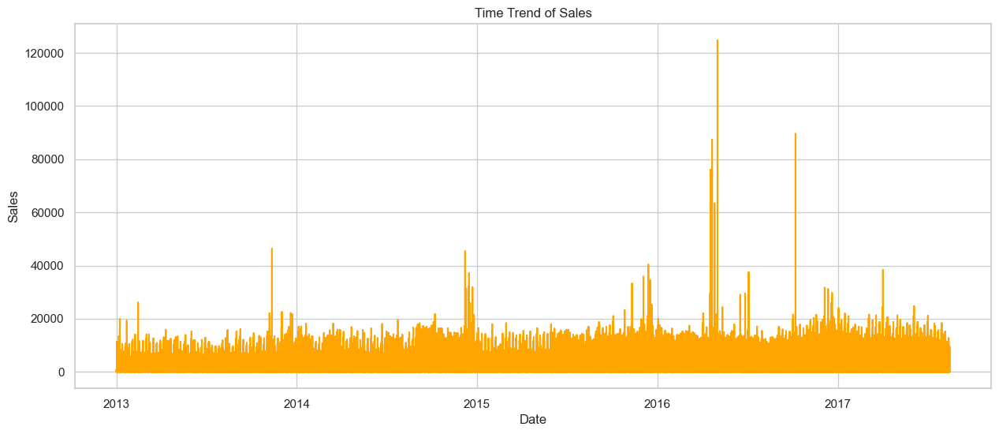

In [233]:
# Time trend of sales
plt.figure(figsize=(15, 6))
plt.plot(data['sales'], color='orange')
plt.title('Time Trend of Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()

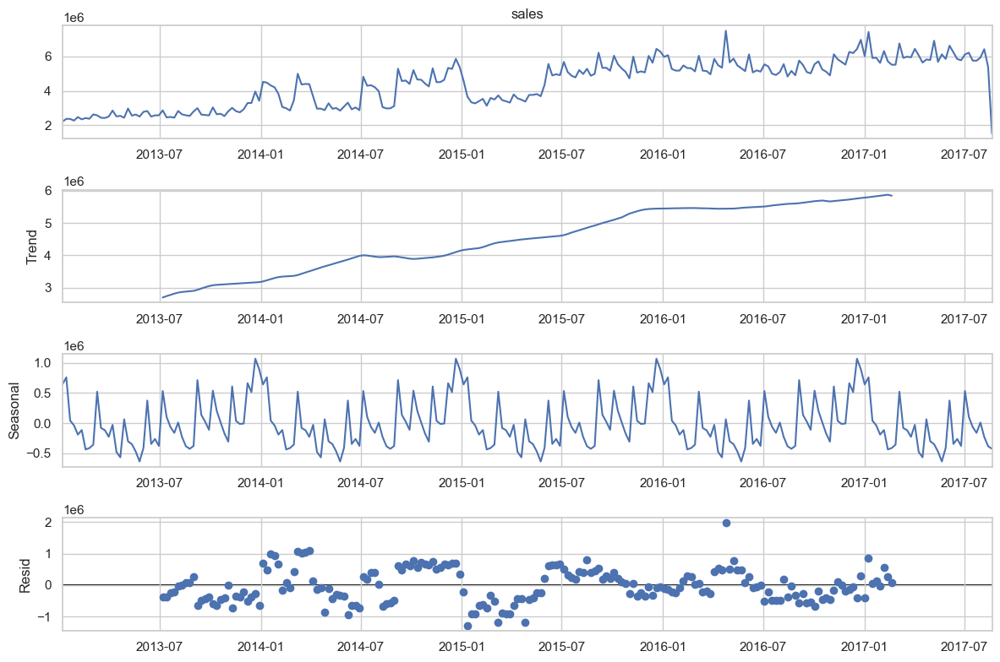

In [234]:
weekly_sales = data['sales'].resample('W').sum()

# Decompose the time series
result = seasonal_decompose(weekly_sales, model='additive')

plt.rcParams['figure.figsize'] = [12, 8]
result.plot()
plt.show()

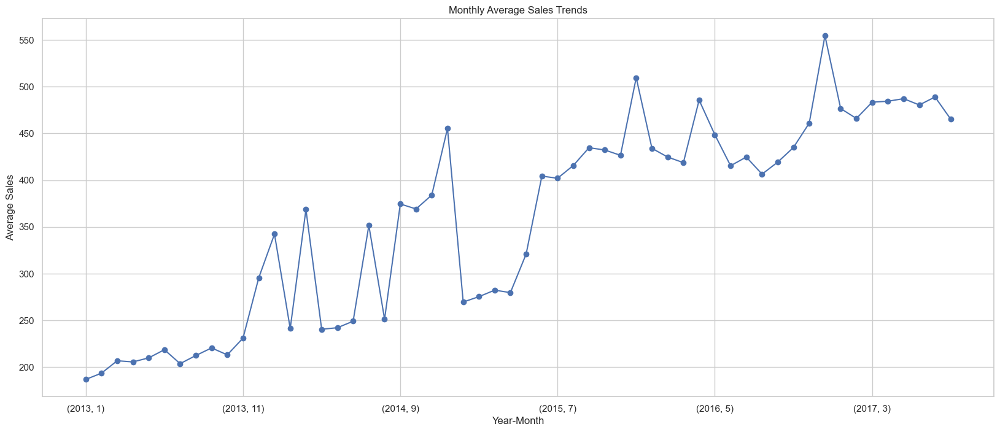

In [235]:
# Monthly Sales Trends
monthly_sales_trends = data.groupby(['year', 'month'])['sales'].mean()
monthly_sales_trends.plot(figsize=(20, 8), marker='o')
plt.title('Monthly Average Sales Trends')
plt.xlabel('Year-Month')
plt.ylabel('Average Sales')

plt.show()

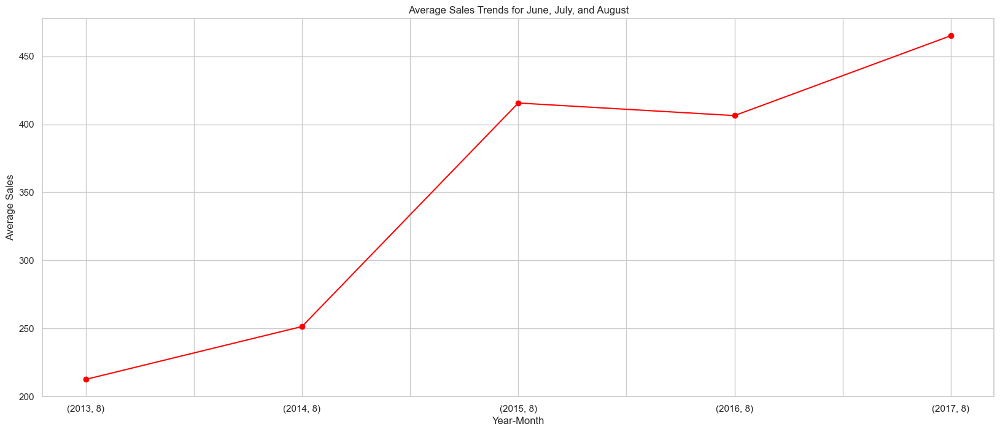

In [236]:
# Filter data for June, July, and August
summer_months_data = data[data['month'].isin([8])]

# Monthly Sales Trends for June, July, and August
summer_monthly_sales_trends = summer_months_data.groupby(['year', 'month'])['sales'].mean()
summer_monthly_sales_trends.plot(figsize=(20, 8), marker='o', color='red')
plt.title('Average Sales Trends for June, July, and August')
plt.xlabel('Year-Month')
plt.ylabel('Average Sales')
plt.show()

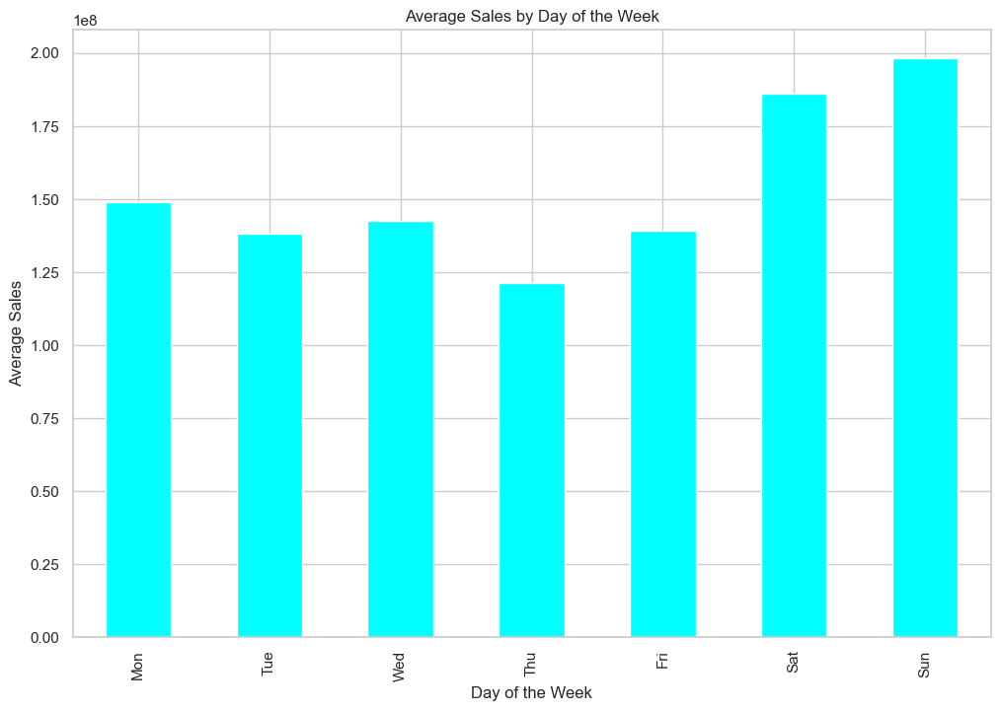

In [237]:
# Day of the Week Sales Analysis
day_of_week_sales = data.groupby('day_of_week')['sales'].sum()
day_of_week_sales.index = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
day_of_week_sales.plot(kind='bar', color='cyan')
plt.title('Average Sales by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Sales')
plt.show()

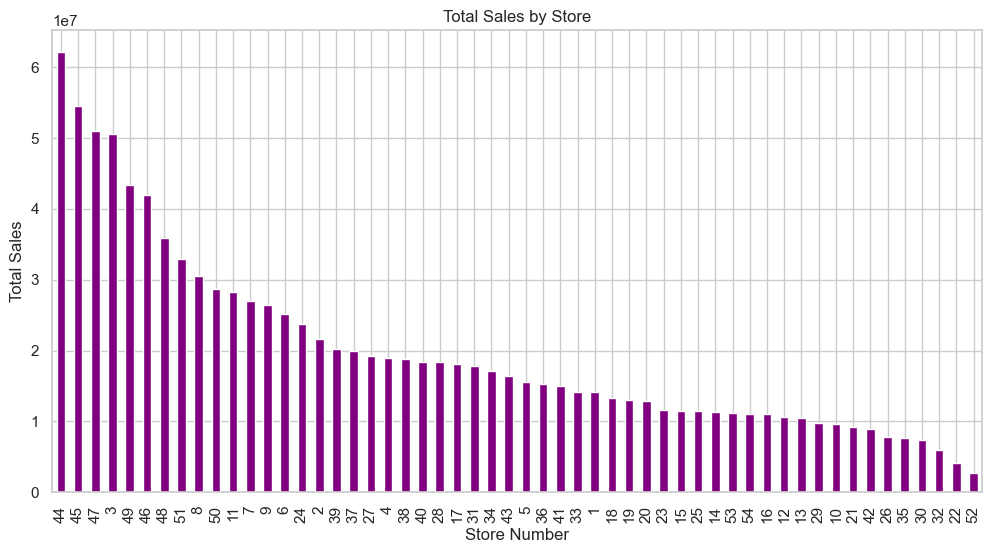

In [267]:
# Store-wise Sales Analysis
store_wise_sales = data.groupby('store_nbr')['sales'].sum().sort_values(ascending=False)
store_wise_sales.plot(kind='bar', figsize=(12, 6), color='purple')
plt.title('Total Sales by Store')
plt.xlabel('Store Number')
plt.ylabel('Total Sales')
plt.show()

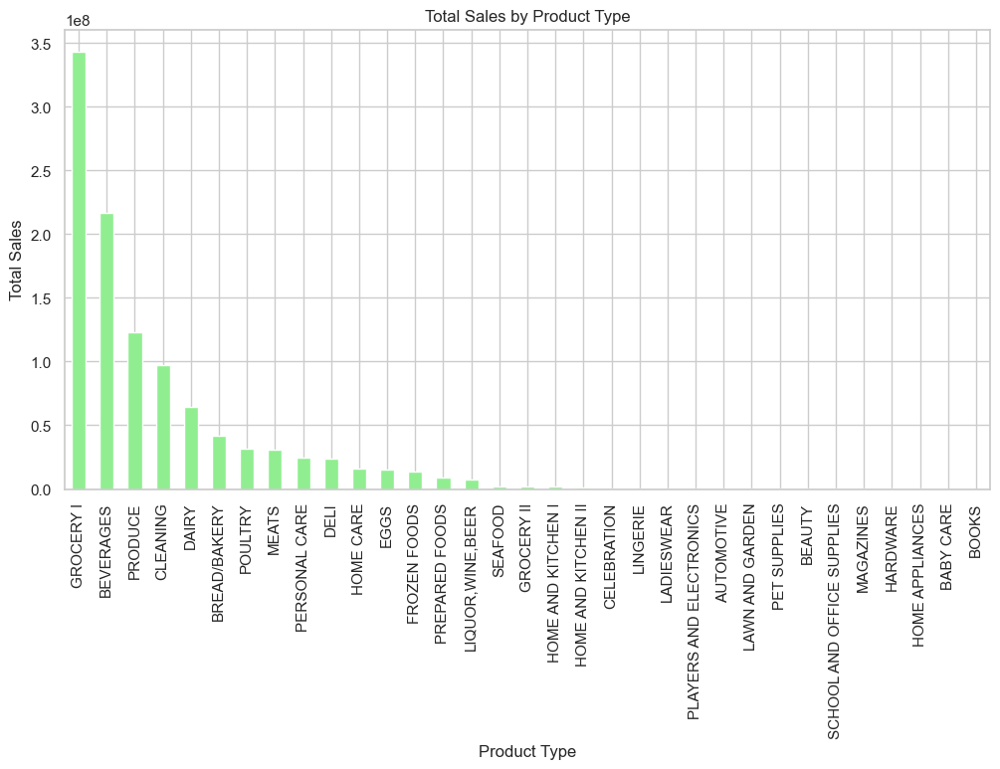

In [239]:
# Product-wise Sales Analysis
product_wise_sales = data.groupby('product_type')['sales'].sum().sort_values(ascending=False)
product_wise_sales.plot(kind='bar', figsize=(12, 6), color='lightgreen')
plt.title('Total Sales by Product Type')
plt.xlabel('Product Type')
plt.ylabel('Total Sales')
plt.show()

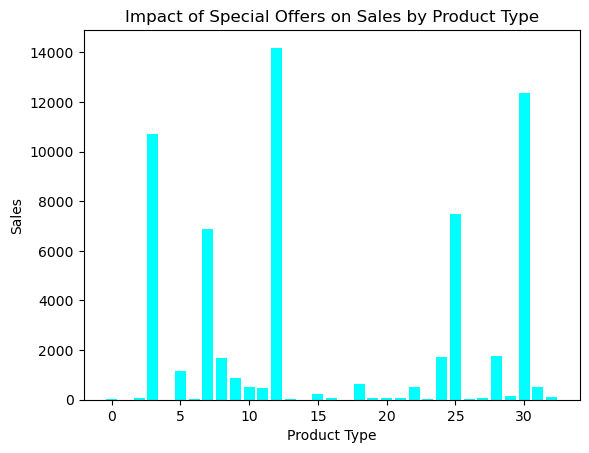

In [278]:
offer_impact_by_product = data.groupby(['product_type', 'special_offer'])['sales'].mean().reset_index()
plt.style.use('default')
plt.bar(offer_impact_by_product['product_type'], offer_impact_by_product['sales'], color='cyan')  # Change 'cyan' to your desired color
plt.title('Impact of Special Offers on Sales by Product Type')
plt.xlabel('Product Type')
plt.ylabel('Sales')

plt.show()

Text(0.5, 1.0, 'Impact of Special Offers on Sales')

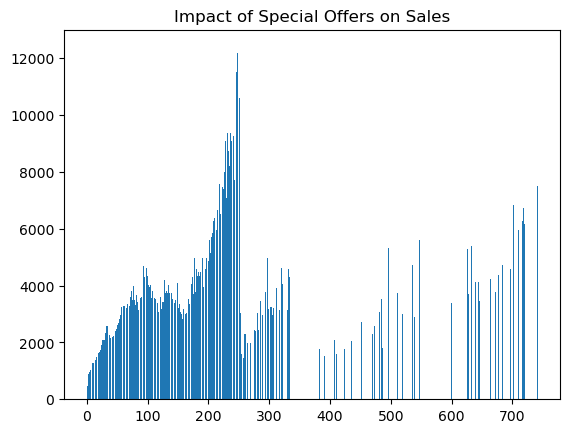

In [277]:
offer_impact = data.groupby('special_offer')['sales'].mean().reset_index()
plt.style.use('default')
plt.bar(offer_impact['special_offer'],offer_impact['sales'])
plt.title('Impact of Special Offers on Sales')

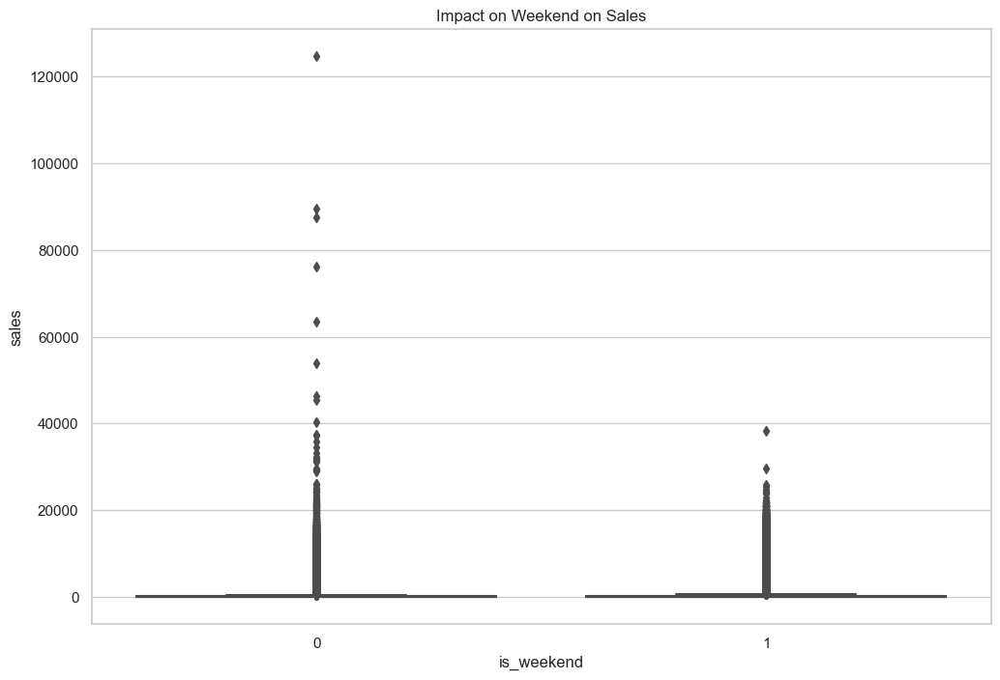

In [242]:
#impact of weekend on sales
sns.boxplot(x=data['is_weekend'],y=data['sales'])
plt.title('Impact on Weekend on Sales')
plt.show()

# Feature Engineering

Feature engineering or feature extraction or feature discovery is the process of extracting features from raw data.

* Temporal features like year, month and day_of_week are created.
* lagged features of 1,7,15,30,60 days
* Moving average of sales (e.g., over the past 16 days)

In [243]:
data

,id,date,store_nbr,product_type,sales,special_offer,year,month,day_of_week,is_weekend
index_date,,,,,,,,,,
2013-01-01,0,2013-01-01,1,AUTOMOTIVE,0.000,0,2013,1,2,0
2013-01-01,1,2013-01-01,1,BABY CARE,0.000,0,2013,1,2,0
2013-01-01,2,2013-01-01,1,BEAUTY,0.000,0,2013,1,2,0
2013-01-01,3,2013-01-01,1,BEVERAGES,0.000,0,2013,1,2,0
2013-01-01,4,2013-01-01,1,BOOKS,0.000,0,2013,1,2,0
...,...,...,...,...,...,...,...,...,...,...
2017-08-15,3000883,2017-08-15,9,POULTRY,438.133,0,2017,8,2,0
2017-08-15,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,2017,8,2,0
2017-08-15,3000885,2017-08-15,9,PRODUCE,2419.729,148,2017,8,2,0


In [256]:
data = data.sort_values(by=['store_nbr', 'product_type', 'date'])
data

,id,date,store_nbr,product_type,sales,special_offer,year,month,day_of_week,is_weekend,sales_lag_1,sales_lag_7,sales_lag_15,sales_lag_30,sales_lag_60,rolling_avg_sales
index_date,,,,,,,,,,,,,,,,
2013-01-01,0,2013-01-01,1,0,0.0,0,2013,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0000
2013-01-02,1782,2013-01-02,1,0,2.0,0,2013,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0000
2013-01-03,3564,2013-01-03,1,0,3.0,0,2013,0,3,0,2.0,0.0,0.0,0.0,0.0,0.0000
2013-01-04,5346,2013-01-04,1,0,3.0,0,2013,0,4,0,3.0,0.0,0.0,0.0,0.0,0.0000
2013-01-05,7128,2013-01-05,1,0,5.0,0,2013,0,5,1,3.0,0.0,0.0,0.0,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,2993627,2017-08-11,54,32,0.0,0,2017,7,4,0,2.0,0.0,2.0,1.0,5.0,3.1250
2017-08-12,2995409,2017-08-12,54,32,1.0,1,2017,7,5,1,0.0,3.0,4.0,0.0,0.0,3.0625
2017-08-13,2997191,2017-08-13,54,32,2.0,0,2017,7,6,1,1.0,0.0,4.0,0.0,3.0,2.9375


## Feature Creation

In [245]:
# Creating lagged sales features
lag_values = [1,7,15,30,60]  # Adjust as needed

for lag in lag_values:
    data[f'sales_lag_{lag}'] = data.groupby(['store_nbr', 'product_type'])['sales'].shift(lag)

In [246]:
# Moving average of sales (e.g., over the past 16 days)
window_size = 16
rolling_avg_sales = data.groupby(['store_nbr', 'product_type'])['sales'].rolling(window=window_size).mean()
data['rolling_avg_sales'] = rolling_avg_sales.reset_index(level=[0,1], drop=True)

In [257]:
data = data.fillna(0)

## Feature Encoding

In [248]:
# Applying Label Encoder
labelencoder = LabelEncoder()

data['month'] = labelencoder.fit_transform(data['month'])
data['day_of_week'] = labelencoder.fit_transform(data['day_of_week'])
data['year'] = data['year'].astype(int)

data['product_type'] = labelencoder.fit_transform(data['product_type'])
data

,id,date,store_nbr,product_type,sales,special_offer,year,month,day_of_week,is_weekend,sales_lag_1,sales_lag_7,sales_lag_15,sales_lag_30,sales_lag_60,rolling_avg_sales
index_date,,,,,,,,,,,,,,,,
2013-01-01,0,2013-01-01,1,0,0.0,0,2013,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0000
2013-01-02,1782,2013-01-02,1,0,2.0,0,2013,0,2,0,0.0,0.0,0.0,0.0,0.0,0.0000
2013-01-03,3564,2013-01-03,1,0,3.0,0,2013,0,3,0,2.0,0.0,0.0,0.0,0.0,0.0000
2013-01-04,5346,2013-01-04,1,0,3.0,0,2013,0,4,0,3.0,0.0,0.0,0.0,0.0,0.0000
2013-01-05,7128,2013-01-05,1,0,5.0,0,2013,0,5,1,3.0,0.0,0.0,0.0,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,2993627,2017-08-11,54,32,0.0,0,2017,7,4,0,2.0,0.0,2.0,1.0,5.0,3.1250
2017-08-12,2995409,2017-08-12,54,32,1.0,1,2017,7,5,1,0.0,3.0,4.0,0.0,0.0,3.0625
2017-08-13,2997191,2017-08-13,54,32,2.0,0,2017,7,6,1,1.0,0.0,4.0,0.0,3.0,2.9375


Note: The choice of a 16-day rolling average of sales as a feature in predictive modeling, especially for retail sales forecasting, is based on several practical reasons:

Weekly Sales Patterns: Retail sales often exhibit weekly patterns. For instance, certain products might sell more during weekends or weekdays. A 7-day rolling average helps in capturing these weekly trends.

Smoothing Out Daily Fluctuations: Daily sales data can be quite volatile due to various factors such as promotions, weather, or random variations. A rolling average smoothens these fluctuations, providing a more stable and representative view of the sales trend.

Seasonal Adjustments: Weekly averages can adjust for minor seasonal variations, like increased shopping activity on specific days of the week, which might not be apparent in daily data.

Data Consistency: In a dataset spanning multiple years, a 16-day average ensures consistency in the data, making it easier to compare periods across different years.

Predictive Relevance: For short-term forecasting, such as predicting sales in the next few weeks, the recent sales trend (like the past week's average) is often more relevant than older data.

Alignment with Promotional and Marketing Activities: Retail promotions are often run on a weekly basis. A 7-day average can effectively capture the impact of such activities.

## Feature Selection

### Correlation HeatMap

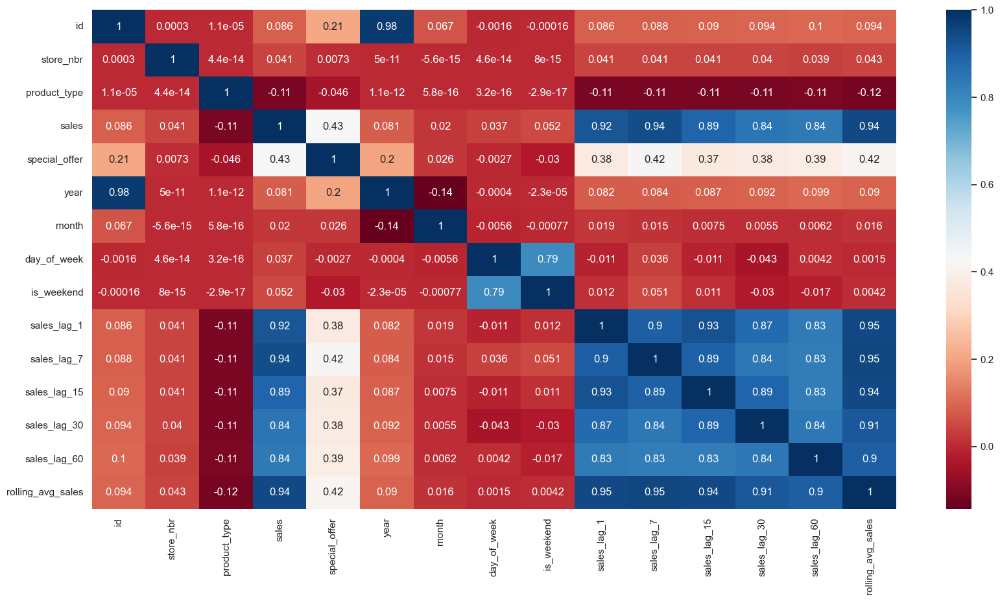

In [258]:
plt.figure(figsize=(20,10))
data_corr = data.corr()
sns.heatmap(data_corr,annot=True,cmap='RdBu')
plt.show()

### SelectKBest

Feature selection is the process of selecting a subset of relevant features for use in model construction.

Why SelectKBest? SelectKBest is a feature selection technique used within the scikit-learn library in Python. It is part of the univariate feature selection methods which work by selecting the best features based on univariate statistical tests (These tests are intended to determine the strength of the relationship between each individual feature and the target).

For regression problems: f_regression, which measures linear dependency between two random variables. For classification problems: chi2, f_classif, or mutual_info_classif.

In [250]:
X = data.drop(data[['sales','date']], axis=1)
y = data['sales']

k =7
bestfeatures = SelectKBest(score_func=f_regression, k=k)
fit = bestfeatures.fit(X, y)

dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

featureScores = pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Feature', 'Score']
print("Best Feature Names with Scores as per the SelectKBest model:")
print(featureScores.nlargest(k, 'Score'))
print()
selected_features = featureScores.nlargest(k, 'Score')['Feature']
print("Best Feature Names as per the SelectKBest model:")
print(selected_features)

X_new = X[selected_features]
train_data_new_with_sales = pd.concat([X_new, y], axis=1)

Best Feature Names with Scores as per the SelectKBest model:
              Feature         Score
13  rolling_avg_sales  2.413343e+07
9         sales_lag_7  2.088978e+07
8         sales_lag_1  1.631247e+07
10       sales_lag_15  1.118377e+07
11       sales_lag_30  7.475799e+06
12       sales_lag_60  6.922998e+06
3       special_offer  6.727009e+05

Best Feature Names as per the SelectKBest model:
13    rolling_avg_sales
9           sales_lag_7
8           sales_lag_1
10         sales_lag_15
11         sales_lag_30
12         sales_lag_60
3         special_offer
Name: Feature, dtype: object


In [251]:
best_features_full_data = train_data_new_with_sales[['rolling_avg_sales','sales_lag_7','sales_lag_15','special_offer','sales']]

In [259]:
best_features_full_data

,rolling_avg_sales,sales_lag_7,sales_lag_15,special_offer,sales
index_date,,,,,
2013-01-01,0.0000,0.0,0.0,0,0.0
2013-01-02,0.0000,0.0,0.0,0,2.0
2013-01-03,0.0000,0.0,0.0,0,3.0
2013-01-04,0.0000,0.0,0.0,0,3.0
2013-01-05,0.0000,0.0,0.0,0,5.0
...,...,...,...,...,...
2017-08-11,3.1250,0.0,2.0,0,0.0
2017-08-12,3.0625,3.0,4.0,1,1.0
2017-08-13,2.9375,0.0,4.0,0,2.0


### Feature Scaling

In [24]:
#Scaling - seen data - BoxCox Transformer
from scipy import stats

# Replace 0 with a small positive value if zeros are present in the data
constant = 1

# Apply Box-Cox transformations
best_features_full_data['rolling_avg_sales'], _ = stats.boxcox(best_features_full_data['rolling_avg_sales'] + constant)
best_features_full_data['sales_lag_7'], _ = stats.boxcox(best_features_full_data['sales_lag_7'] + constant)
best_features_full_data['sales_lag_15'], _ = stats.boxcox(best_features_full_data['sales_lag_15'] + constant)
best_features_full_data['special_offer'], _ = stats.boxcox(best_features_full_data['special_offer'] + constant)

In [25]:
#scaler = preprocessing.StandardScaler()
#best_features_full_data[['special_offer','rolling_avg_sales','sales_lag_7','sales_lag_15']]=scaler.fit_transform(best_features_full_data[['special_offer','rolling_avg_sales','sales_lag_7','sales_lag_15']])

In [26]:
best_features_full_data

,rolling_avg_sales,sales_lag_7,sales_lag_15,special_offer,sales
index_date,,,,,
2013-01-01,0.000000,0.000000,0.000000,0.000000,0.0
2013-01-02,0.000000,0.000000,0.000000,0.000000,2.0
2013-01-03,0.000000,0.000000,0.000000,0.000000,3.0
2013-01-04,0.000000,0.000000,0.000000,0.000000,3.0
2013-01-05,0.000000,0.000000,0.000000,0.000000,5.0
...,...,...,...,...,...
2017-08-11,1.320205,0.000000,1.032891,0.000000,0.0
2017-08-12,1.306966,1.285073,1.471022,0.347068,1.0
2017-08-13,1.279802,0.000000,1.471022,0.000000,2.0


In [27]:
#Spliting the data

seen_data = best_features_full_data["2015-01-01":"2017-07-30"]

unseen_data = best_features_full_data["2017-07-31":]

print("Seen Data")
print("************************")
print(seen_data)
print()
print("Unseen Data")
print("************************")
print(unseen_data)

Seen Data
************************
            rolling_avg_sales  sales_lag_7  sales_lag_15  special_offer  sales
index_date                                                                    
2015-01-01           1.192230     1.750430      1.621349       0.000000    0.0
2015-01-02           1.144551     0.667198      1.852312       0.000000    2.0
2015-01-03           1.128007     1.034379      0.000000       0.000000    6.0
2015-01-04           1.192230     0.000000      1.282754       0.000000    4.0
2015-01-05           1.222505     0.667198      0.666588       0.000000    5.0
...                       ...          ...           ...            ...    ...
2017-07-26           1.207511     0.000000      1.282754       0.347068    3.0
2017-07-27           1.192230     1.285073      0.666588       0.000000    2.0
2017-07-28           1.237221     0.000000      0.000000       0.000000    4.0
2017-07-29           1.293501     1.285073      0.000000       0.400908    4.0
2017-07-30       

# Modelling

## Train Test Split

In [28]:
X = seen_data.drop("sales", axis = 1)
y = seen_data["sales"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

## 1. Linear Regression

In [29]:
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression()
lr_model.fit(X_train,y_train)

LinearRegression()

In [30]:
print("Training Score -------",lr_model.score(X_train,y_train))
print("Testing Score -------",lr_model.score(X_test,y_test))

Training Score ------- 0.26105669757418926
Testing Score ------- 0.26543014471372195


In [31]:
y_pred_lr = lr_model.predict(X_test)

In [32]:
mse = mean_squared_error(y_test,y_pred_lr,squared=False)
mae = mean_absolute_error(y_test,y_pred_lr)
print("MSE -------",mse)
print("MAE -------",mae)

MSE ------- 1054.399595875114
MAE ------- 554.0148741083113


### Predictions on Unseen Data

In [73]:
X_unseen_test_lr = unseen_data.drop(columns=['sales','store_nbr','product_type'])
predictions_lr = lr_model.predict(X_unseen_test_lr)

mae = mean_absolute_error(unseen_data['sales'], predictions_lr)
mse = mean_squared_error(unseen_data['sales'], predictions_lr)
rmse = mean_squared_error(unseen_data['sales'], predictions_lr,squared=False)


print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")

Mean Absolute Error: 603.0182940018728
Mean Squared Error: 1128307.332077711
Root Mean Squared Error: 1062.2181188803506


### Combining Actual and predicted sales

In [74]:
final_data_lr = pd.concat([unseen_data[['store_nbr','product_type','sales']].reset_index(),pd.DataFrame(predictions_lr)],axis=1)

In [75]:
final_data_lr.rename(columns={0:'predicted_sales'},inplace=True)
final_data_lr.rename(columns={'index_date':'date'},inplace=True)

In [76]:
final_data_lr

,date,store_nbr,product_type,sales,predicted_sales
0,2017-07-31,1,0,8.0,24.192141
1,2017-08-01,1,0,5.0,47.402041
2,2017-08-02,1,0,4.0,18.665501
3,2017-08-03,1,0,3.0,18.458346
4,2017-08-04,1,0,8.0,36.695455
...,...,...,...,...,...
28507,2017-08-11,54,32,0.0,-93.735323
28508,2017-08-12,54,32,1.0,260.345104
28509,2017-08-13,54,32,2.0,-116.497913
28510,2017-08-14,54,32,0.0,-132.372230


In [ ]:
final_data_lr.to_csv("Unseen_pred_lr.csv")

### Linear Regression: Actual vs Predicted

### Total sales vs predicted (all time)

In [263]:
final_lr = pd.read_csv("Unseen_pred_lr.csv")

In [264]:
final_lr

,Unnamed: 0,date,store_nbr,product_type,sales,predicted_sales
0,0,2017-07-31,1,0,8.0,24.192141
1,1,2017-08-01,1,0,5.0,47.402041
2,2,2017-08-02,1,0,4.0,18.665501
3,3,2017-08-03,1,0,3.0,18.458346
4,4,2017-08-04,1,0,8.0,36.695455
...,...,...,...,...,...,...
28507,28507,2017-08-11,54,32,0.0,-93.735323
28508,28508,2017-08-12,54,32,1.0,260.345104
28509,28509,2017-08-13,54,32,2.0,-116.497913
28510,28510,2017-08-14,54,32,0.0,-132.372230


In [265]:
summed_lr = pd.DataFrame(final_lr.groupby('date')['sales'].sum())
pred_summed_lr = pd.DataFrame(final_lr.groupby('date')['predicted_sales'].sum())

(array([ 600000.,  650000.,  700000.,  750000.,  800000.,  850000.,
         900000.,  950000., 1000000., 1050000., 1100000.]),
 [Text(0, 600000.0, '0.60'),
  Text(0, 650000.0, '0.65'),
  Text(0, 700000.0, '0.70'),
  Text(0, 750000.0, '0.75'),
  Text(0, 800000.0, '0.80'),
  Text(0, 850000.0, '0.85'),
  Text(0, 900000.0, '0.90'),
  Text(0, 950000.0, '0.95'),
  Text(0, 1000000.0, '1.00'),
  Text(0, 1050000.0, '1.05'),
  Text(0, 1100000.0, '1.10')])

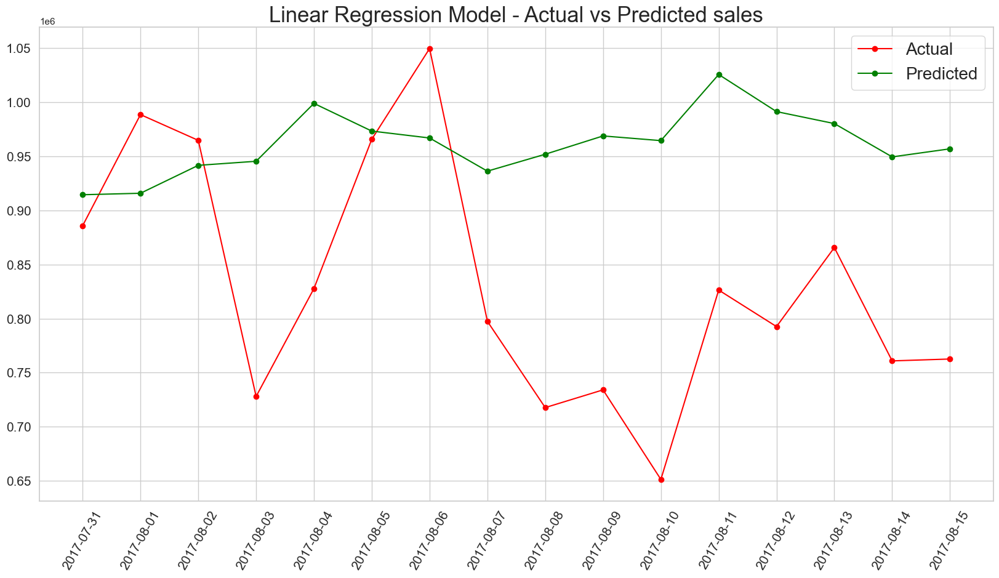

In [266]:
plt.figure(figsize=(20,10))
plt.plot(summed_lr['sales'],marker='o',label='Actual',color='red')
plt.plot(pred_summed_lr['predicted_sales'],marker='o',label='Predicted',color='green')
plt.legend(fontsize=20)
plt.title("Linear Regression Model - Actual vs Predicted sales",fontsize=25)
plt.xticks(fontsize=15, rotation=60)
plt.yticks(fontsize=15)

## 2. Random Forest

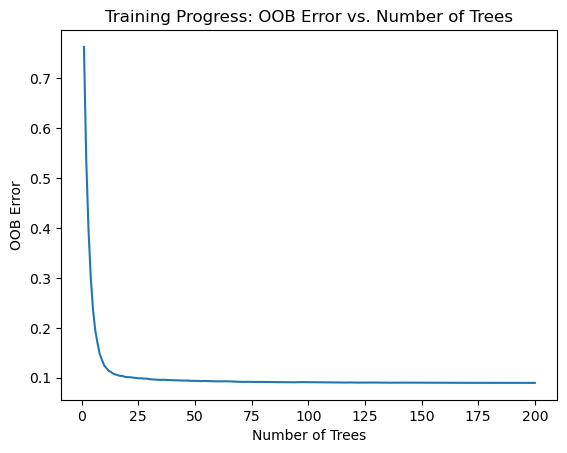

In [37]:
n_estimators=200
rf_model = RandomForestRegressor(n_estimators=n_estimators,oob_score=True,warm_start=True)


oob_errors = []
for i in range(1, n_estimators+1):
    rf_model.n_estimators = i  # Set the number of trees
    rf_model.fit(X_train, y_train)
    oob_error = 1 - rf_model.oob_score_
    oob_errors.append(oob_error)

plt.plot(range(1, n_estimators+1), oob_errors)
plt.xlabel('Number of Trees')
plt.ylabel('OOB Error')
plt.title('Training Progress: OOB Error vs. Number of Trees')
plt.show()

In [285]:
rf_model.oob_score_

0.9102744398290942

In [66]:
importances = rf_model.feature_importances_
importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
feature_importance_df

,Feature,Importance
0,rolling_avg_sales,0.871867
1,sales_lag_7,0.087130
2,sales_lag_15,0.025210
3,special_offer,0.015794


In [40]:
print("Training Score -------",rf_model.score(X_train,y_train))
print("Testing Score -------",rf_model.score(X_test,y_test))

Training Score ------- 0.9882797820001183
Testing Score ------- 0.9307743577055378


In [41]:
y_pred_rf = rf_model.predict(X_test)

In [50]:
export_pred_rf = pd.DataFrame(y_pred_rf)
export_pred_rf.to_csv("export_pred_rf_2015.csv")

In [42]:
mse = mean_squared_error(y_test,y_pred_rf,squared=False)
mae = mean_absolute_error(y_test,y_pred_rf)
print("MSE -------",mse)
print("MAE -------",mae)

MSE ------- 323.6847038306698
MAE ------- 79.35536247211368


### Prediction on Unseen Data

In [44]:
X_unseen_test = unseen_data.drop(columns=['sales'])
predictions = rf_model.predict(X_unseen_test)

mae = mean_absolute_error(unseen_data['sales'], predictions)
mse = mean_squared_error(unseen_data['sales'], predictions)
rmse = mean_squared_error(unseen_data['sales'], predictions,squared=False)


print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")

Mean Absolute Error: 87.09056187006601
Mean Squared Error: 90492.34544734615
Root Mean Squared Error: 300.81945656381026


In [46]:
data_trimmed = data['2017-07-31':]

In [48]:
unseen_data['store_nbr']=data_trimmed['store_nbr']
unseen_data['product_type']=data_trimmed['product_type']

In [50]:
final_data = pd.concat([unseen_data[['store_nbr','product_type','sales']].reset_index(),pd.DataFrame(predictions)],axis=1)

In [55]:
final_data.rename(columns={0:'predicted_sales'},inplace=True)
final_data.rename(columns={'index_date':'date'},inplace=True)

In [56]:
final_data

,date,store_nbr,product_type,sales,predicted_sales
0,2017-07-31,1,0,8.0,4.778179
1,2017-08-01,1,0,5.0,7.581328
2,2017-08-02,1,0,4.0,5.442089
3,2017-08-03,1,0,3.0,4.572344
4,2017-08-04,1,0,8.0,4.816661
...,...,...,...,...,...
28507,2017-08-11,54,32,0.0,3.443701
28508,2017-08-12,54,32,1.0,5.491697
28509,2017-08-13,54,32,2.0,2.754819
28510,2017-08-14,54,32,0.0,2.810651


In [57]:
final_data.to_csv("UnseenData_predictions.csv")

## 3.XG Boost

In [33]:
xgb = XGBRegressor(enable_categorical=True)
xgb.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=True, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [34]:
print("Training Score -------",xgb.score(X_train,y_train))
print("Testing Score -------",xgb.score(X_test,y_test))

Training Score ------- 0.9362428736510318
Testing Score ------- 0.9305830176762462


In [35]:
y_pred_xgb = xgb.predict(X_test)

In [36]:
mse = mean_squared_error(y_test,y_pred_xgb,squared=False)
mae = mean_absolute_error(y_test,y_pred_xgb)
print("MSE -------",mse)
print("MAE -------",mae)

MSE ------- 324.13172823767025
MAE ------- 78.30522111634008


### Predictions on Unseen Data

In [68]:
X_unseen_test_xgb = unseen_data.drop(columns=['sales','store_nbr','product_type'])
predictions_xgb = xgb.predict(X_unseen_test)

mae = mean_absolute_error(unseen_data['sales'], predictions_xgb)
mse = mean_squared_error(unseen_data['sales'], predictions_xgb)
rmse = mean_squared_error(unseen_data['sales'], predictions_xgb,squared=False)


print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")

Mean Absolute Error: 85.14151681991574
Mean Squared Error: 90784.97556264253
Root Mean Squared Error: 301.30545226172484


### Combining Actual and predicted sales

In [69]:
final_data_xgb = pd.concat([unseen_data[['store_nbr','product_type','sales']].reset_index(),pd.DataFrame(predictions_xgb)],axis=1)

In [70]:
final_data_xgb.rename(columns={0:'predicted_sales'},inplace=True)
final_data_xgb.rename(columns={'index_date':'date'},inplace=True)

In [71]:
final_data_xgb.to_csv("Unseen_pred_xgb.csv")

### XGBRegressor: Actual vs Predicted

### Total sales vs predicted (all time)

In [260]:
final_xgb = pd.read_csv("Unseen_pred_xgb.csv")
final_xgb

,Unnamed: 0,date,store_nbr,product_type,sales,predicted_sales
0,0,2017-07-31,1,0,8.0,4.764376
1,1,2017-08-01,1,0,5.0,4.764376
2,2,2017-08-02,1,0,4.0,4.764376
3,3,2017-08-03,1,0,3.0,4.764376
4,4,2017-08-04,1,0,8.0,4.764376
...,...,...,...,...,...,...
28507,28507,2017-08-11,54,32,0.0,0.281239
28508,28508,2017-08-12,54,32,1.0,4.729339
28509,28509,2017-08-13,54,32,2.0,0.281239
28510,28510,2017-08-14,54,32,0.0,0.281239


In [261]:
summed_xgb = pd.DataFrame(final_xgb.groupby('date')['sales'].sum())

pred_summed_xgb = pd.DataFrame(final_xgb.groupby('date')['predicted_sales'].sum())


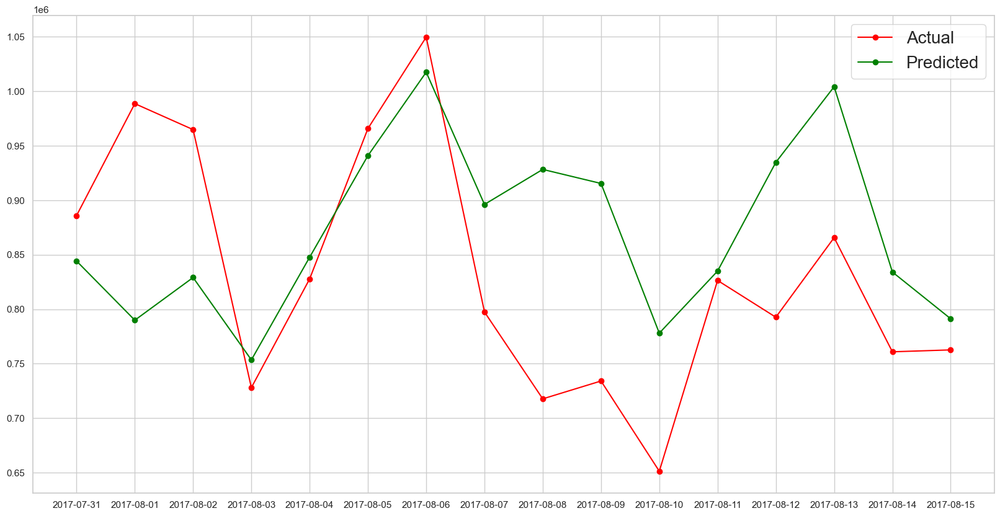

In [262]:
plt.figure(figsize=(20,10))
plt.plot(summed_xgb['sales'],marker='o',label='Actual',color='red')
plt.plot(pred_summed_xgb['predicted_sales'],marker='o',label='Predicted',color='green')
plt.legend(fontsize=20)

# Time Series Analysis

## Weekly Sales and Decomposing the time series

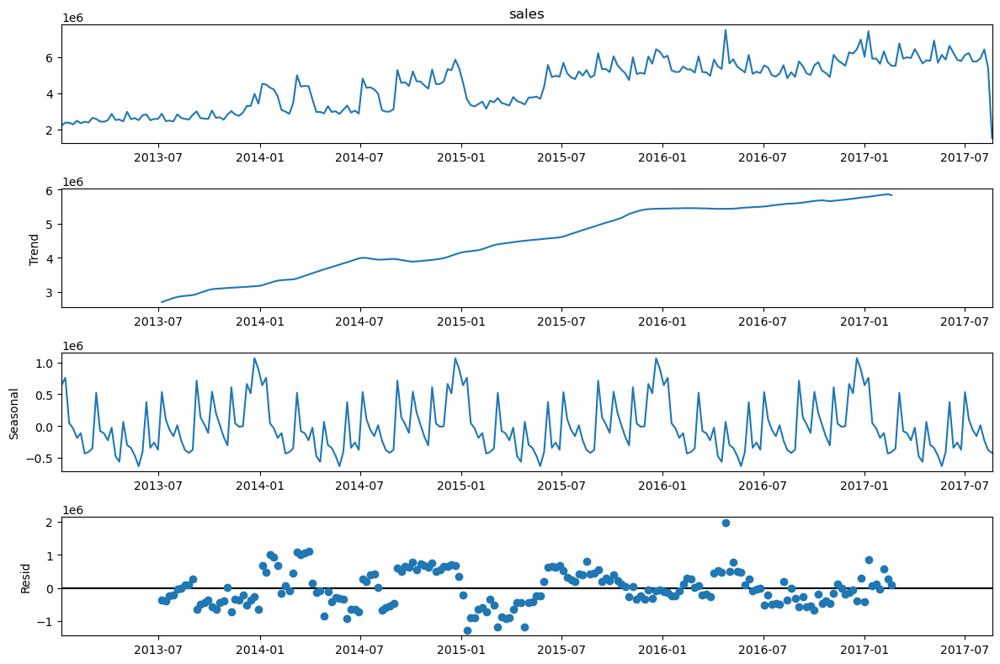

In [279]:
df = pd.read_csv("Products_Information.csv")
df['date'] = pd.to_datetime(df['date'])  # Converting 'date' to datetime object

df.set_index('date', inplace=True)
df.sort_index(inplace=True)

# Weekly resampling
weekly_sales = df['sales'].resample('W').sum()

# Decompose the time series
result = seasonal_decompose(weekly_sales, model='additive')

plt.rcParams['figure.figsize'] = [12, 8]
result.plot()
plt.show()

## Calculating the Augmented Dickey-Fuller (ADF) and p-value

ADF Statistic: -1.913783
p-value: 0.325605


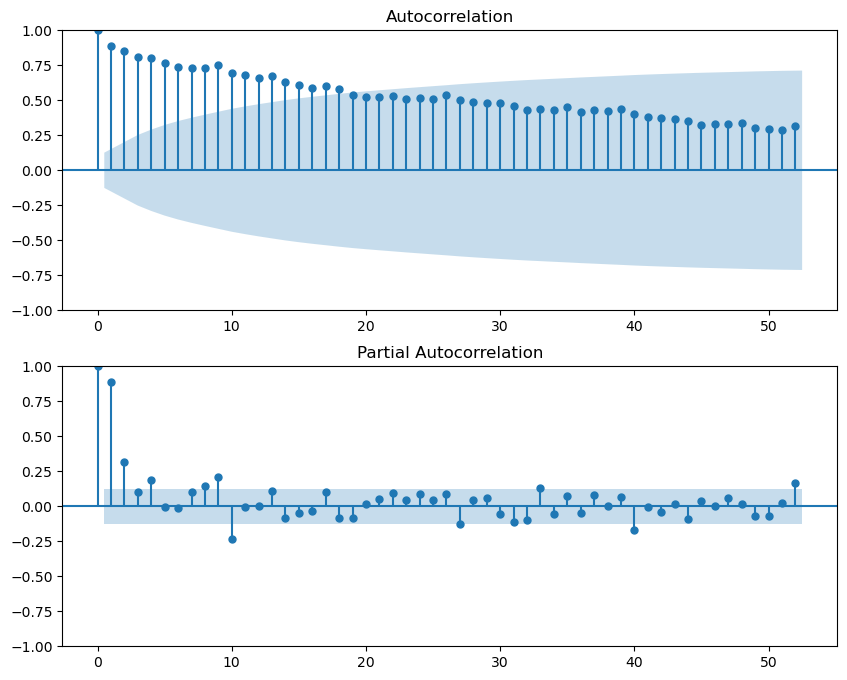

In [280]:
result = adfuller(weekly_sales)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

fig, ax = plt.subplots(2,1, figsize=(10,8))
plot_acf(weekly_sales, ax=ax[0], lags=52)
plot_pacf(weekly_sales, ax=ax[1], lags=52)
plt.show()

### ADF Statistic and p-value:

ADF Statistic: A more negative value suggests stronger stationarity.
p-value: If the p-value is less than a significance level (commonly 0.05), the null hypothesis of the ADF test (which states the time series is non-stationary) can be rejected.
In our case, with an ADF statistic of -1.913783 and a p-value of 0.325605, the test suggests that the time series is not stationary, as the p-value is higher than 0.05.

### Selecting appropriate p, d and q for ARIMA based on Autocorrelation and Partial Autocorrelation Analysis

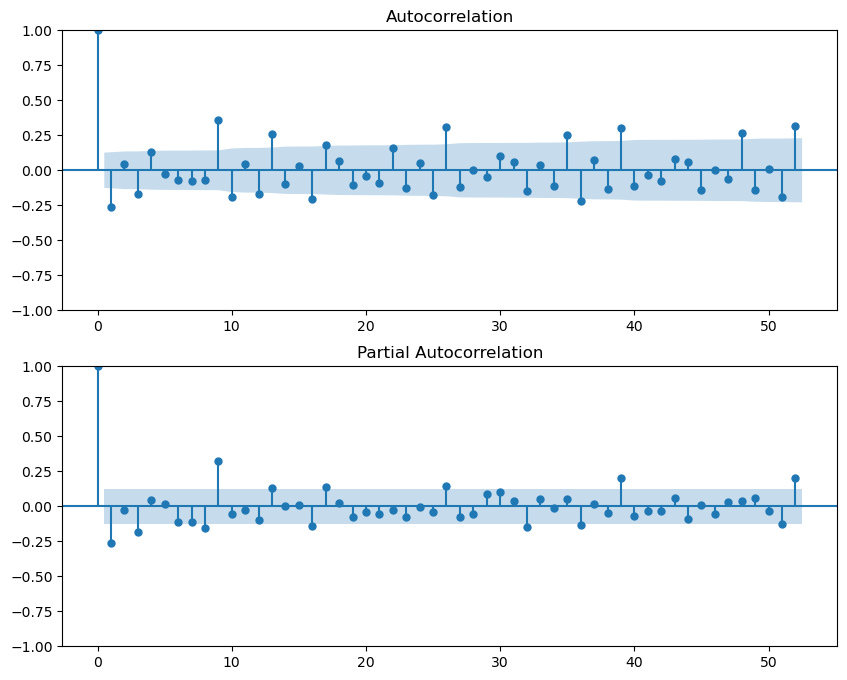

In [281]:
# First differencing the series if d is 1
data_diff = weekly_sales.diff().dropna()

# Plot ACF and PACF
fig, ax = plt.subplots(2,1, figsize=(10,8))
plot_acf(data_diff, ax=ax[0], lags=52)  # ACF plot
plot_pacf(data_diff, ax=ax[1], lags=52)  # PACF plot
plt.show()

### ACF Plot: 
This indicates the correlation between the time series and its lagged values. For ARIMA, significant lags in the ACF plot suggest the q parameter, which corresponds to the MA (Moving Average) part.

### PACF Plot: 
This indicates the partial correlation between the time series and its lagged values, accounting for the values of the time series at all shorter lags. Significant lags here suggest the p parameter, which corresponds to the AR (Autoregressive) part.

Looking at our ACF plot, it seems that after the initial lag, the correlations quickly fall within the confidence interval, which suggests that the MA component (q) could be zero or one, given that the first lag is close to the significance limit.

In the PACF plot, there's a significant spike at lag 1, and then other spikes are within the confidence interval, which suggests an AR(1) process. Therefore, p is likely 1.

The d value corresponds to the level of differencing required to make the series stationary. Since the ADF test suggests non-stationarity (p-value > 0.05), you'll likely need to difference the data at least once, so d could be 1.

### Note: 
The choice of lags=52 in the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots for weekly sales data is likely based on the assumption that the data might have yearly seasonality. In short using lags=52 for weekly data is a strategic choice to explore potential yearly seasonal effects in your time series. If significant correlations are observed at lag 52 (or near it), it would suggest that incorporating seasonal components in your time series model could be beneficial.

### ARIMA

ARIMA is an autoregressive integrated moving average (ARIMA) model is a statistical analysis model that leverages time series data to forecast future trends.

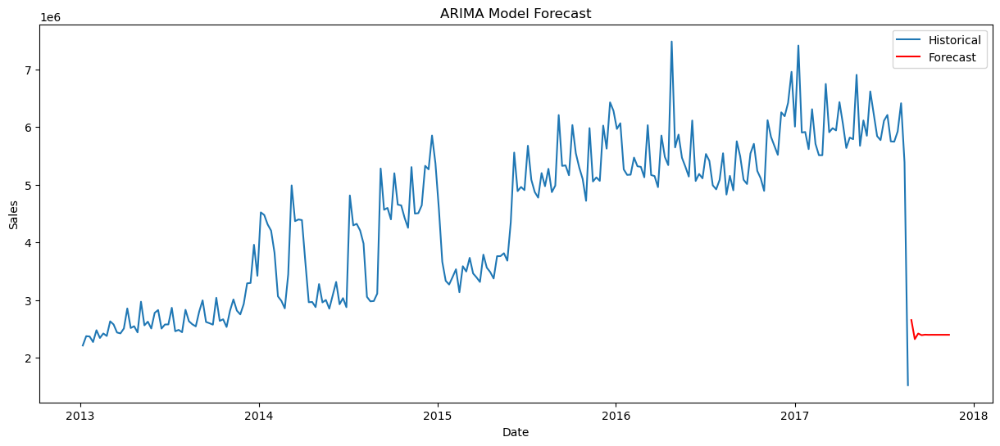

In [282]:
p, d, q = 1, 1, 0

# Fit the ARIMA model
model = ARIMA(weekly_sales, order=(p, d, q))
model_fit = model.fit()

# Forecast
forecast = model_fit.forecast(steps=12)  # Forecasting next 24 periods

# Plotting the results
plt.figure(figsize=(15, 6))
plt.plot(weekly_sales, label='Historical')
plt.plot(forecast, label='Forecast', color='red')
plt.title('ARIMA Model Forecast')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Random Forest: Actual vs Predicted Graphs - Storewise and Productwise

## Total sales vs predicted (all time)

In [78]:
final = pd.read_csv("UnseenData_predictions.csv")

In [79]:
final

,Unnamed: 0,date,store_nbr,product_type,sales,predicted_sales
0,0,2017-07-31,1,0,8.0,4.778179
1,1,2017-08-01,1,0,5.0,7.581328
2,2,2017-08-02,1,0,4.0,5.442089
3,3,2017-08-03,1,0,3.0,4.572344
4,4,2017-08-04,1,0,8.0,4.816661
...,...,...,...,...,...,...
28507,28507,2017-08-11,54,32,0.0,3.443701
28508,28508,2017-08-12,54,32,1.0,5.491697
28509,28509,2017-08-13,54,32,2.0,2.754819
28510,28510,2017-08-14,54,32,0.0,2.810651


In [80]:
summed = pd.DataFrame(final.groupby('date')['sales'].sum())

In [81]:
summed

,sales
date,
2017-07-31,8.858568e+05
2017-08-01,9.885278e+05
2017-08-02,9.647120e+05
2017-08-03,7.280685e+05
2017-08-04,8.277757e+05
2017-08-05,9.656937e+05
2017-08-06,1.049559e+06
2017-08-07,7.974650e+05
2017-08-08,7.177663e+05


In [82]:
pred_summed = pd.DataFrame(final.groupby('date')['predicted_sales'].sum())

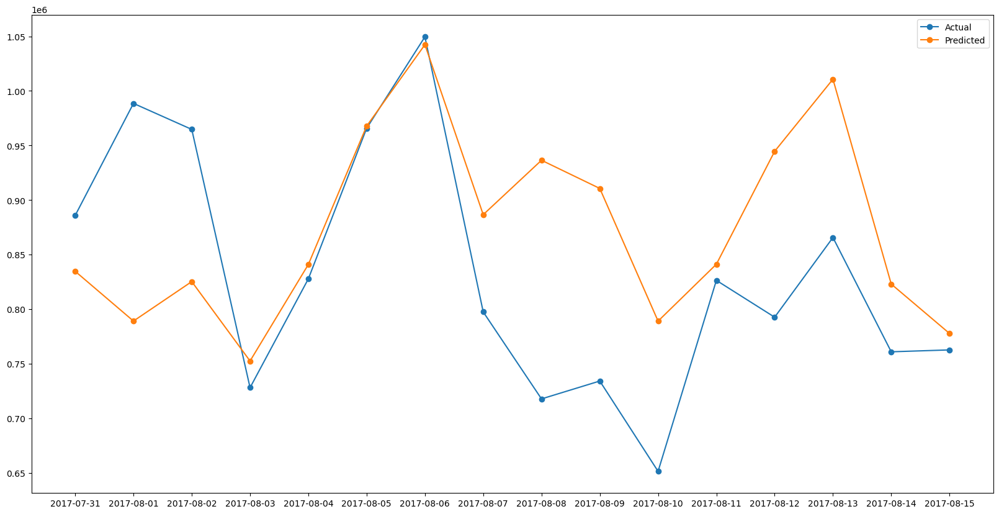

In [83]:
plt.figure(figsize=(20,10))
plt.plot(summed['sales'],marker='o',label='Actual')
plt.plot(pred_summed['predicted_sales'],marker='o',label='Predicted')
plt.legend()


## Storewise graphs

In [84]:
# Filter data for the specified date range and unique stores
filtered_df = final[(final['date'] >= '2017-07-31') & (final['date'] <= '2017-08-15') & 
                 (final['store_nbr'].between(1, 54))]

# Group by 'date' and 'store_nbr' and sum the 'sales' for each date and store
summed_sales= filtered_df.groupby(['date', 'store_nbr'])['sales'].sum().reset_index()

# Print or plot the results
print(summed_sales)

           date  store_nbr         sales
0    2017-07-31          1  11626.725000
1    2017-07-31          2  13739.413996
2    2017-07-31          3  34192.049000
3    2017-07-31          4  11622.438000
4    2017-07-31          5  10798.739000
..          ...        ...           ...
859  2017-08-15         50  16879.121004
860  2017-08-15         51  20154.559000
861  2017-08-15         52  18600.046000
862  2017-08-15         53   8208.189000
863  2017-08-15         54  12666.858000

[864 rows x 3 columns]


In [85]:
# Filter data for the specified date range and unique stores
filtered_df = final[(final['date'] >= '2017-07-31') & (final['date'] <= '2017-08-15') & 
                 (final['store_nbr'].between(1, 54))]

# Group by 'date' and 'store_nbr' and sum the 'sales' for each date and store
summed_predicted_sales = filtered_df.groupby(['date', 'store_nbr'])['predicted_sales'].sum().reset_index()

# Print or plot the results
print(summed_predicted_sales)

           date  store_nbr  predicted_sales
0    2017-07-31          1     10610.021719
1    2017-07-31          2     14636.663155
2    2017-07-31          3     34543.187913
3    2017-07-31          4     12129.760010
4    2017-07-31          5     10776.877988
..          ...        ...              ...
859  2017-08-15         50     18078.063624
860  2017-08-15         51     19428.022989
861  2017-08-15         52     19606.851438
862  2017-08-15         53      9760.900824
863  2017-08-15         54     11647.420235

[864 rows x 3 columns]


In [86]:
merged_sales = pd.merge(summed_sales,summed_predicted_sales,how='inner',on=['store_nbr','date'])

In [87]:
merged_sales

,date,store_nbr,sales,predicted_sales
0,2017-07-31,1,11626.725000,10610.021719
1,2017-07-31,2,13739.413996,14636.663155
2,2017-07-31,3,34192.049000,34543.187913
3,2017-07-31,4,11622.438000,12129.760010
4,2017-07-31,5,10798.739000,10776.877988
...,...,...,...,...
859,2017-08-15,50,16879.121004,18078.063624
860,2017-08-15,51,20154.559000,19428.022989
861,2017-08-15,52,18600.046000,19606.851438
862,2017-08-15,53,8208.189000,9760.900824


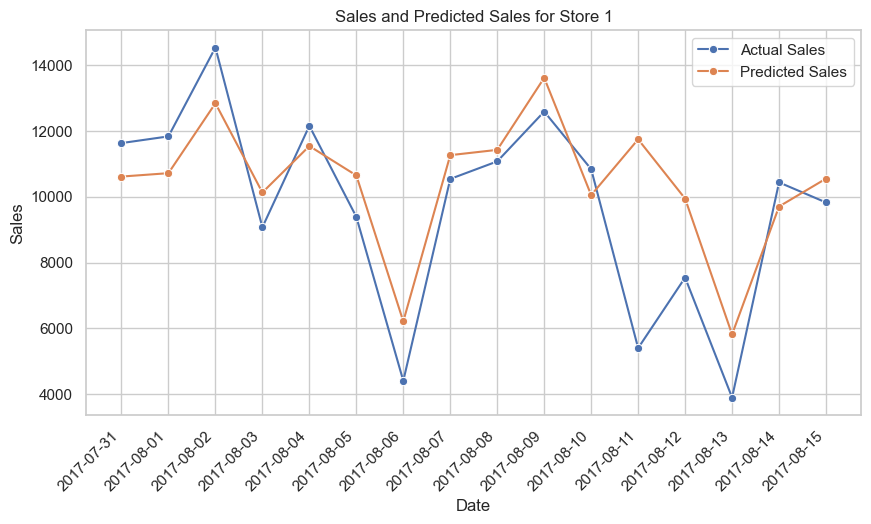

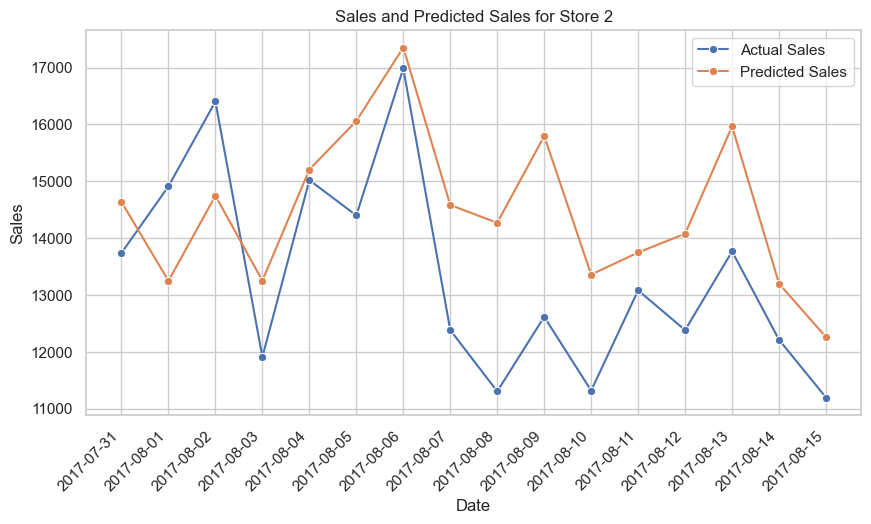

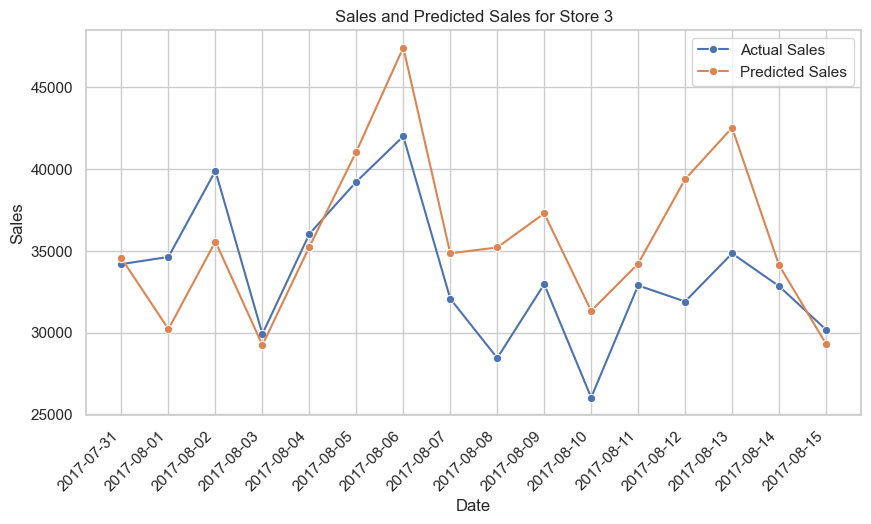

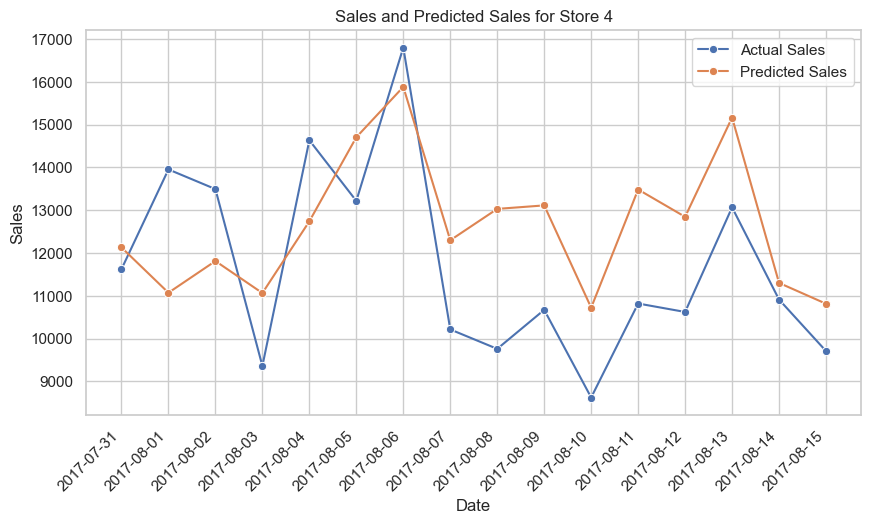

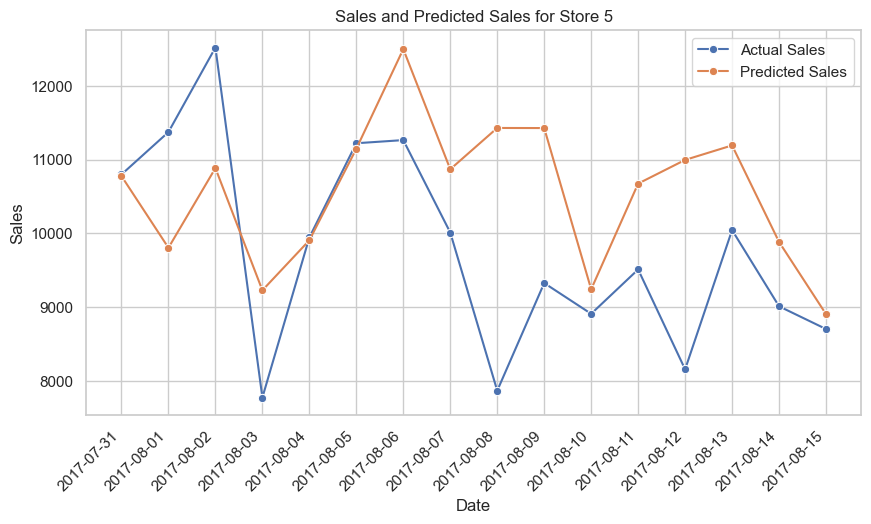

...

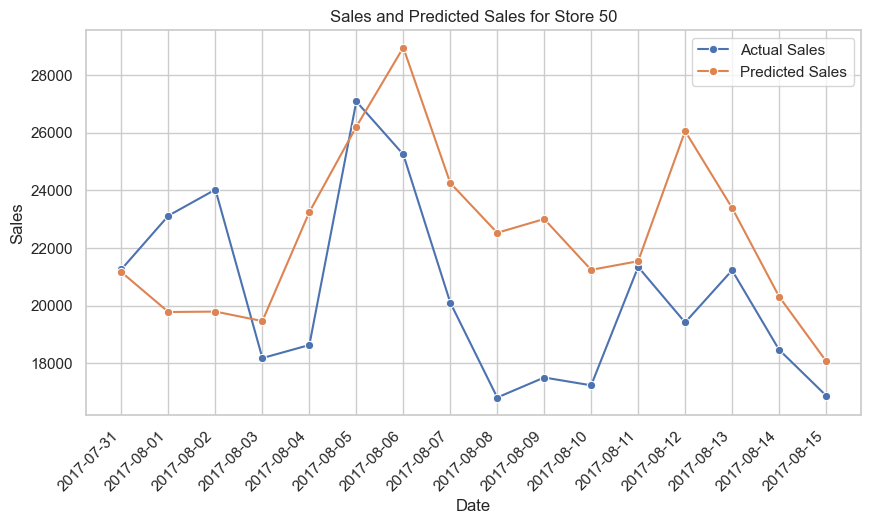

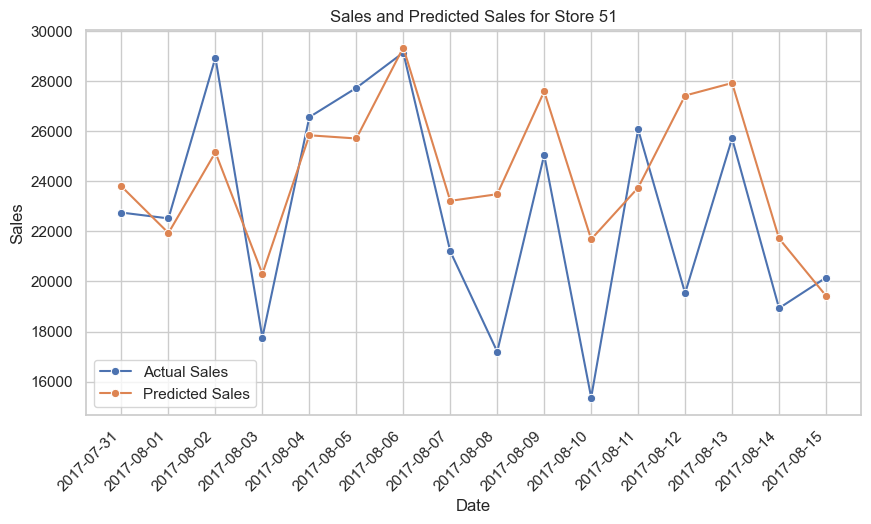

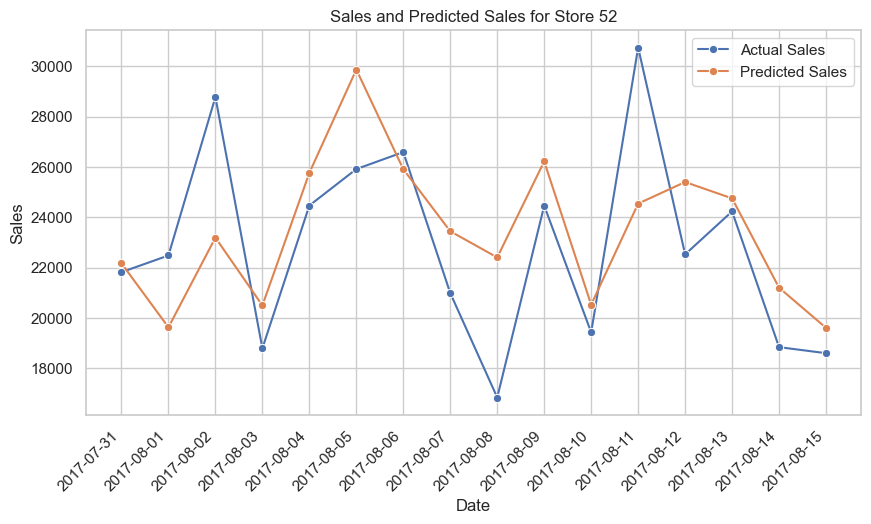

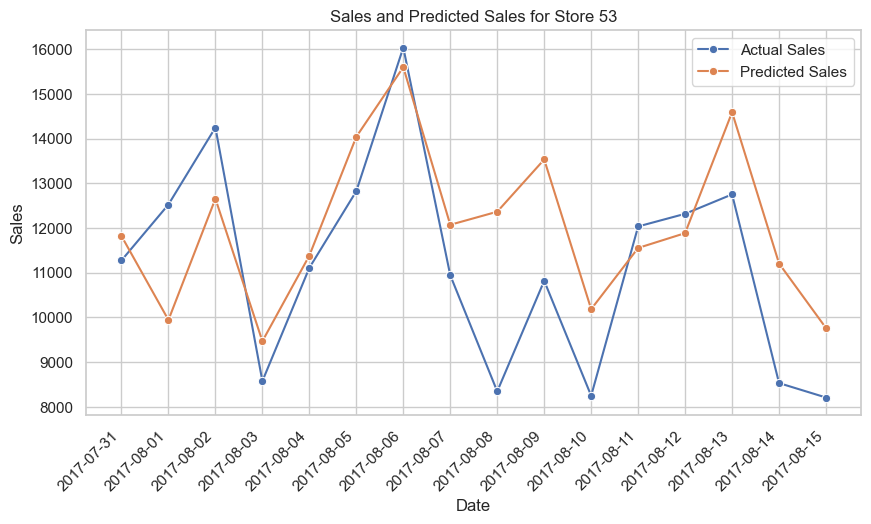

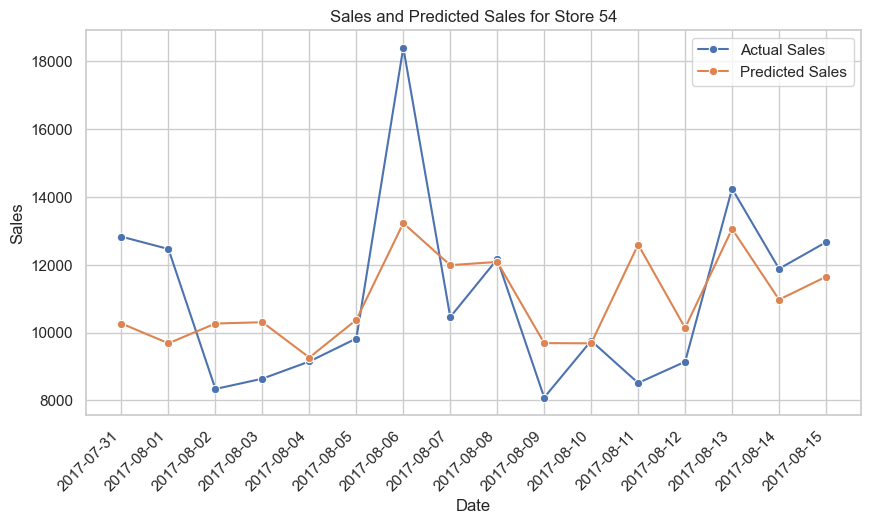

In [88]:
sns.set(style="whitegrid")

# Iterate over unique store numbers
for store_nbr in merged_sales['store_nbr'].unique():
    # Filter data for the current store
    store_data = merged_sales[merged_sales['store_nbr'] == store_nbr]

    # Create a line plot for sales and predicted sales
    plt.figure(figsize=(10, 5))
    sns.lineplot(x='date', y='sales', data=store_data, label='Actual Sales',marker='o')
    sns.lineplot(x='date', y='predicted_sales', data=store_data, label='Predicted Sales',marker='o')

    # Set plot labels and title
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Sales and Predicted Sales for Store {store_nbr}')

    # Rotate x-axis labels for better visibility
    plt.xticks(rotation=45, ha='right')

    # Show the legend
    plt.legend()

    # Show the plot
    plt.show()

## Product Wise Graph

In [98]:
final['product_type'] = labelencoder.inverse_transform(final['product_type'])

In [99]:
final

,Unnamed: 0,date,store_nbr,product_type,sales,predicted_sales
0,0,2017-07-31,1,AUTOMOTIVE,8.0,4.778179
1,1,2017-08-01,1,AUTOMOTIVE,5.0,7.581328
2,2,2017-08-02,1,AUTOMOTIVE,4.0,5.442089
3,3,2017-08-03,1,AUTOMOTIVE,3.0,4.572344
4,4,2017-08-04,1,AUTOMOTIVE,8.0,4.816661
...,...,...,...,...,...,...
28507,28507,2017-08-11,54,SEAFOOD,0.0,3.443701
28508,28508,2017-08-12,54,SEAFOOD,1.0,5.491697
28509,28509,2017-08-13,54,SEAFOOD,2.0,2.754819
28510,28510,2017-08-14,54,SEAFOOD,0.0,2.810651


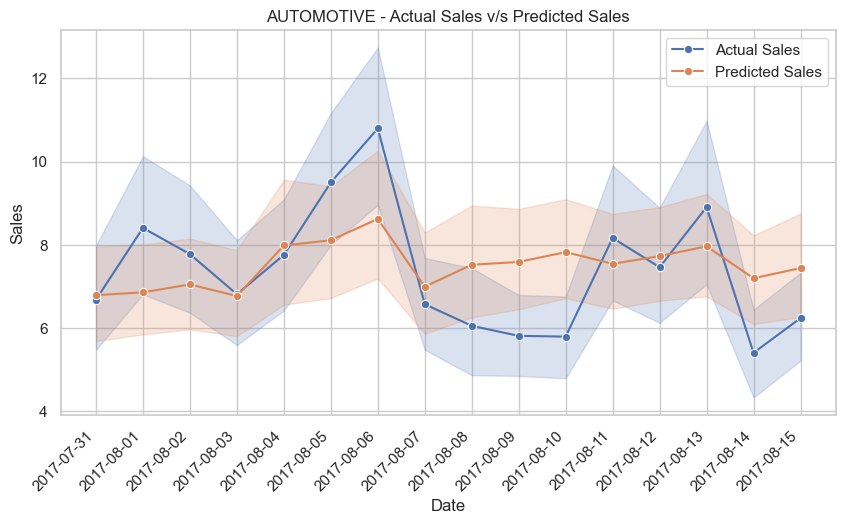

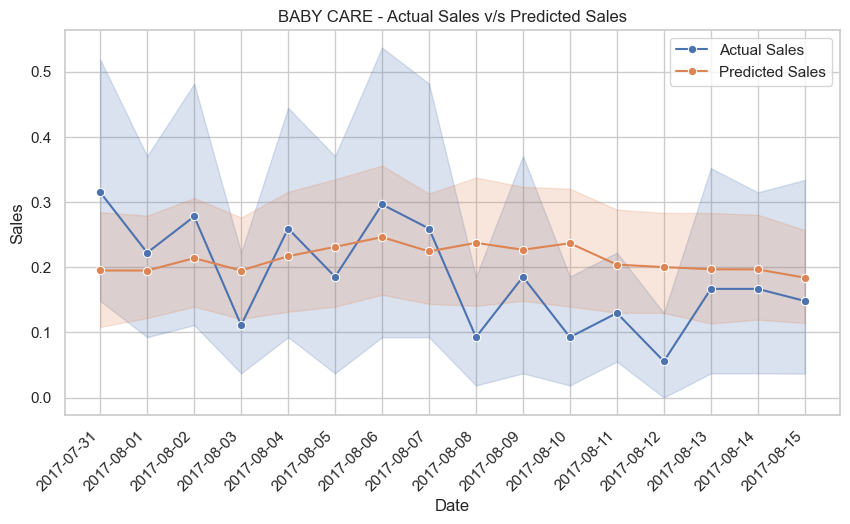

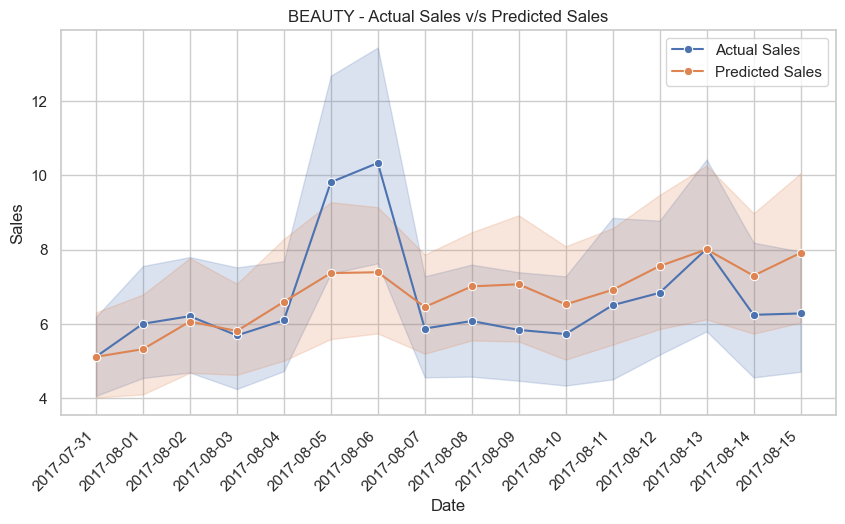

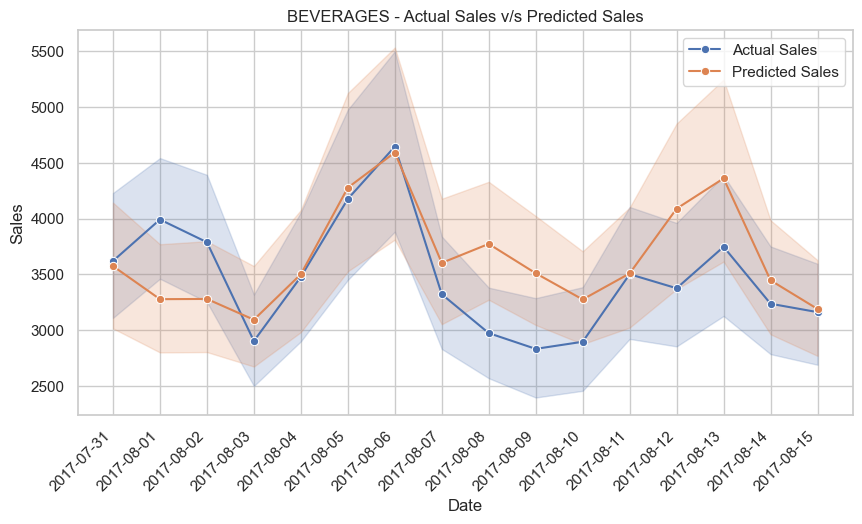

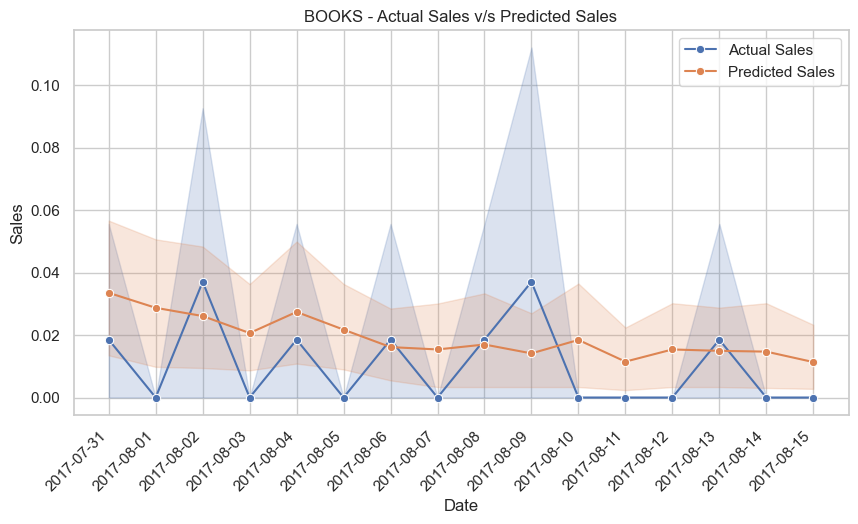

...

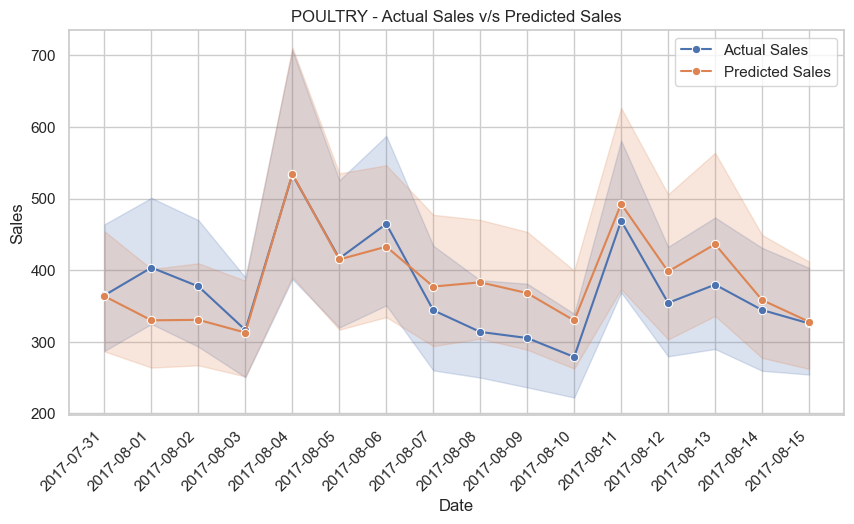

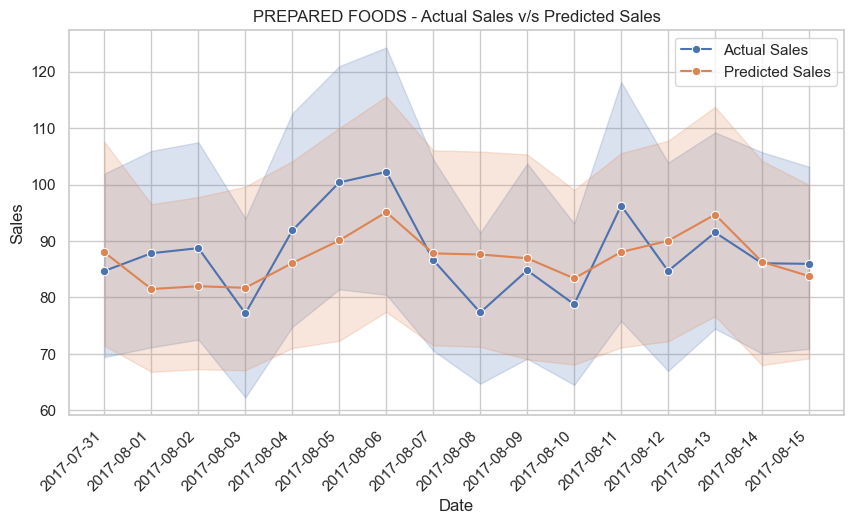

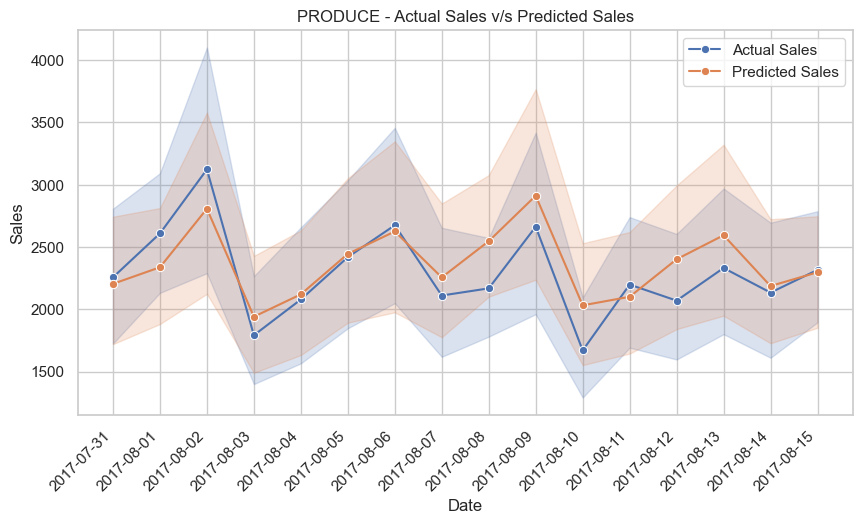

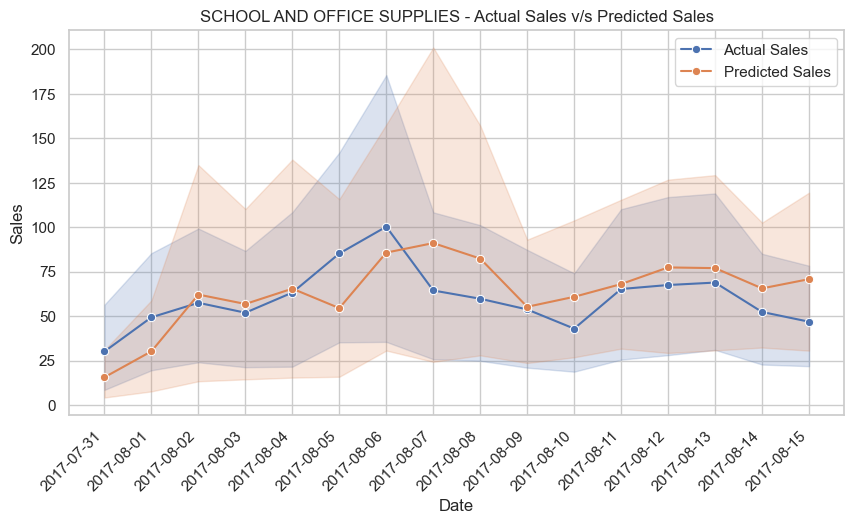

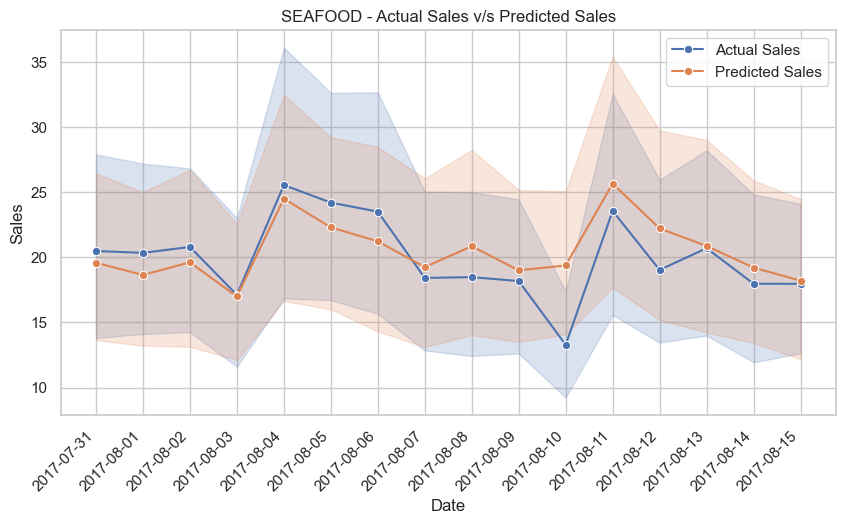

In [100]:
## Actual vs predicted sales for every product type - 16 days period
# Iterate over unique product types
for product_type in final['product_type'].unique():
    # Filter data for the current product type
    product_data = final[final['product_type'] == product_type]

    # Create a line plot for sales and predicted sales
    plt.figure(figsize=(10, 5))
    sns.lineplot(x='date', y='sales', data=product_data, label='Actual Sales', marker='o')
    sns.lineplot(x='date', y='predicted_sales', data=product_data, label='Predicted Sales', marker='o')

    # Set plot labels and title
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'{product_type} - Actual Sales v/s Predicted Sales')

    # Rotate x-axis labels for better visibility
    plt.xticks(rotation=45, ha='right')

    # Show the legend
    plt.legend()

    # Show the plot
    plt.show()

# HyperParameter Tuning

In [286]:
param_grid = {
    'n_estimators': [300],
    'min_samples_split': [5],
    'min_samples_leaf': [5],
    'max_features': ['auto', 'sqrt', 'log2']
}

grid_search = GridSearchCV(rf_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=RandomForestRegressor(n_estimators=200, oob_score=True,
                                             warm_start=True),
             param_grid={'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [5], 'min_samples_split': [5],
                         'n_estimators': [300]},
             scoring='neg_mean_squared_error')

In [315]:
best_params = grid_search.best_params_ 
best_model = grid_search.best_estimator_ 

In [316]:
best_params

{'max_features': 'sqrt',
 'min_samples_leaf': 5,
 'min_samples_split': 5,
 'n_estimators': 300}

In [289]:
best_model

RandomForestRegressor(max_features='sqrt', min_samples_leaf=5,
                      min_samples_split=5, n_estimators=300, oob_score=True,
                      warm_start=True)

In [290]:
tuned_predictions = best_model.predict(X_test)
test_mse = mean_squared_error(y_test, tuned_predictions)
test_rmse = mean_squared_error(y_test, tuned_predictions, squared=False)

In [291]:
test_mse

99066.7603304566

In [292]:
test_rmse

314.7487257010846

In [294]:
X_unseen_test = unseen_data.drop(columns=['sales','product_type','store_nbr'])
tuned_predictions = best_model.predict(X_unseen_test)

mae = mean_absolute_error(unseen_data['sales'], tuned_predictions)
mse = mean_squared_error(unseen_data['sales'], tuned_predictions)
rmse = mean_squared_error(unseen_data['sales'], tuned_predictions,squared=False)


print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")

Mean Absolute Error: 83.96644820198296
Mean Squared Error: 84524.423897688
Root Mean Squared Error: 290.7308444208973


## Total sales vs predicted (all time)

In [297]:
final_data_tuned = pd.concat([unseen_data[['store_nbr','product_type','sales']].reset_index(),pd.DataFrame(tuned_predictions)],axis=1)

In [301]:
final_data_tuned.rename(columns={0:'predicted_tuned_sales'},inplace=True)
final_data_tuned.rename(columns={'index_date':'date'},inplace=True)

In [302]:
final_data_tuned

,date,store_nbr,product_type,sales,predicted_tuned_sales
0,2017-07-31,1,0,8.0,4.706833
1,2017-08-01,1,0,5.0,6.764011
2,2017-08-02,1,0,4.0,5.327129
3,2017-08-03,1,0,3.0,4.683065
4,2017-08-04,1,0,8.0,5.009571
...,...,...,...,...,...
28507,2017-08-11,54,32,0.0,3.436092
28508,2017-08-12,54,32,1.0,3.588129
28509,2017-08-13,54,32,2.0,2.733216
28510,2017-08-14,54,32,0.0,2.714036


In [305]:
summed_actual = pd.DataFrame(final_data_tuned.groupby('date')['sales'].sum())

In [304]:
pred_tuned_sales = pd.DataFrame(final_data_tuned.groupby('date')['predicted_tuned_sales'].sum())

In [306]:
summed_actual

,sales
date,
2017-07-31,8.858568e+05
2017-08-01,9.885278e+05
2017-08-02,9.647120e+05
2017-08-03,7.280685e+05
2017-08-04,8.277757e+05
2017-08-05,9.656937e+05
2017-08-06,1.049559e+06
2017-08-07,7.974650e+05
2017-08-08,7.177663e+05


In [307]:
pred_tuned_sales

,predicted_tuned_sales
date,
2017-07-31,8.315525e+05
2017-08-01,7.823436e+05
2017-08-02,8.182895e+05
2017-08-03,7.504103e+05
2017-08-04,8.370540e+05
2017-08-05,9.606962e+05
2017-08-06,1.039434e+06
2017-08-07,8.842570e+05
2017-08-08,9.309164e+05


(array([ 600000.,  650000.,  700000.,  750000.,  800000.,  850000.,
         900000.,  950000., 1000000., 1050000., 1100000.]),
 [Text(0, 600000.0, '0.60'),
  Text(0, 650000.0, '0.65'),
  Text(0, 700000.0, '0.70'),
  Text(0, 750000.0, '0.75'),
  Text(0, 800000.0, '0.80'),
  Text(0, 850000.0, '0.85'),
  Text(0, 900000.0, '0.90'),
  Text(0, 950000.0, '0.95'),
  Text(0, 1000000.0, '1.00'),
  Text(0, 1050000.0, '1.05'),
  Text(0, 1100000.0, '1.10')])

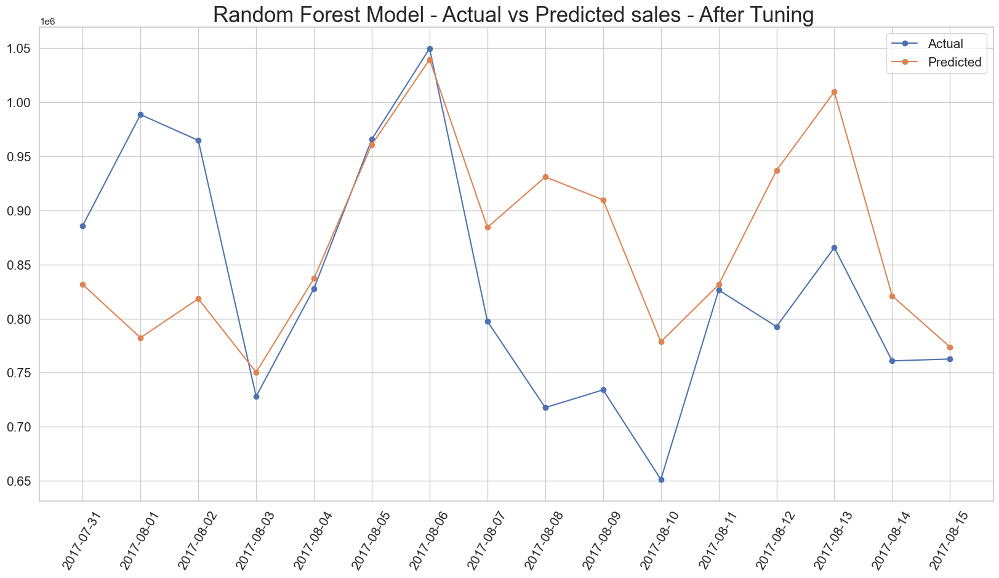

In [314]:
data_values = pred_tuned_sales.index
sns.set(style="whitegrid")
plt.figure(figsize=(20,10))
plt.plot(summed_actual['sales'],marker='o',label='Actual')
plt.plot(pred_tuned_sales['predicted_tuned_sales'],marker='o',label='Predicted')
plt.legend(fontsize=15)
plt.title("Random Forest Model - Actual vs Predicted sales - After Tuning ",fontsize=25)
plt.xticks(data_values,fontsize=15, rotation=60)
plt.yticks(fontsize=15)